In [1]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error
from sklearn.linear_model import Ridge, Lasso
from sklearn.model_selection import KFold
import lightgbm as lgb
# from itertools import combinations

# from catboost import Pool, CatBoostRegressor
# from sklearn.feature_selection import SelectKBest, f_regression

In [2]:
weather = pd.read_csv('data/weather_v2.csv')
target = pd.read_csv('data/EDA_target.csv')

/home/ubuntu/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning: Columns (25) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [3]:
cols = ['temp', 'ws', 'wd', 'humid', 'landP', 'seaP', 'sfctemp']

# 5. 모델 학습 및 검증
- lgbm을 이용하여 2가지 모델 작성

 
- 1) 과거 정보를 이용해 supply, 기상정보를 예측하는 모델 (시계열 모델)

- 2) supply, 기상정보를 이용하여 smp를 예측하는 모델 (상관관계 모델)

- 1)의 모델을 이용해 supply, 기상정보를 예측한 후 2)의 모델로 smp를 예측

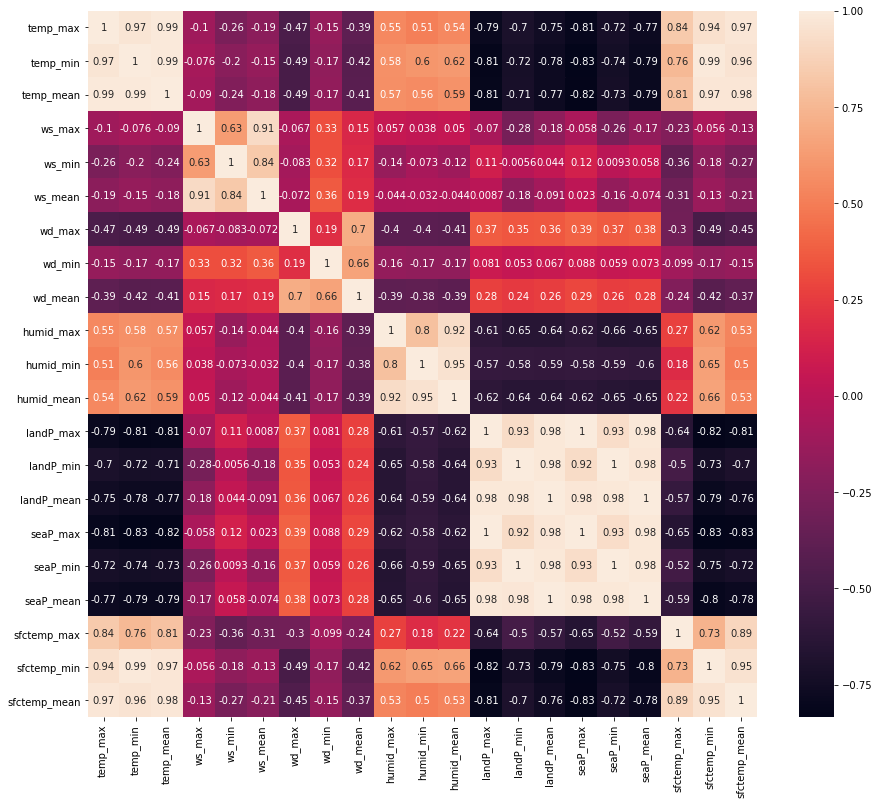

In [4]:
plt.rcParams['figure.figsize'] = [15, 13]
sns.heatmap(target[target.columns[9:-3]].corr(), annot=True)

In [5]:
past = 29 # 최근 30일 정보를 이용하여 n일 후를 예측

In [6]:
def trans(dataset, start_index, end_index, past, future, x_columns, y_columns):
    dataset.index = range(dataset.shape[0])
    data = []
    labels = []
    
    start_index = start_index + past
    
    if end_index is None:
        end_index = dataset.shape[0]
    
    for i in range(start_index, end_index-future):
        indices = np.array(dataset.loc[i-past:i, x_columns])
        data.append(indices)
        
        labels.append(np.array(dataset.loc[i+future, y_columns]))
        
    data = np.array(data)
    data = data.reshape(data.shape[0], -1)
    labels = np.array(labels)
    labels = labels.reshape(-1)
    
    return data, labels

In [10]:
def create_model(x_train, y_train, x_val, y_val):
    params = {
        'metric': 'mae',
        'seed':7777
        }
    
    d_train = lgb.Dataset(x_train, y_train)
    d_val = lgb.Dataset(x_val, y_val)

    model = lgb.train(params, d_train, 1200, \
                      d_val, verbose_eval=200, \
                      early_stopping_rounds=800)

    return model

In [11]:
x_columns = ['landP_mean', 'seaP_mean', 'sfctemp_mean', \
             'stand_temp_max', 'stand_temp_min', 'stand_temp_mean', \
             'year', 'month', 'day', 'dayofweek']

## Supply

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.6
[400]	valid_0's l1: 3.58987
[600]	valid_0's l1: 3.59061
[800]	valid_0's l1: 3.59306
Early stopping, best iteration is:
[50]	valid_0's l1: 3.53191


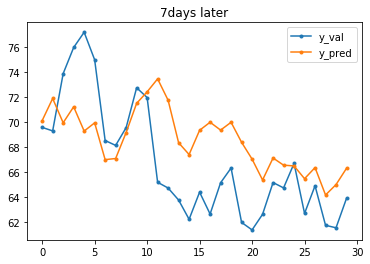

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.77936
[400]	valid_0's l1: 3.7573
[600]	valid_0's l1: 3.75102
[800]	valid_0's l1: 3.74873
[1000]	valid_0's l1: 3.74712
[1200]	valid_0's l1: 3.74621
Did not meet early stopping. Best iteration is:
[1187]	valid_0's l1: 3.74614


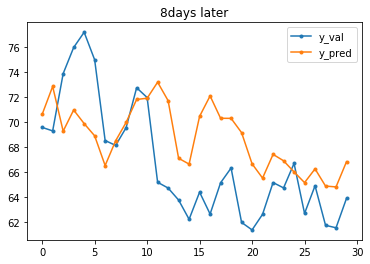

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.72443
[400]	valid_0's l1: 3.70677
[600]	valid_0's l1: 3.7033
[800]	valid_0's l1: 3.70264
Early stopping, best iteration is:
[87]	valid_0's l1: 3.70103


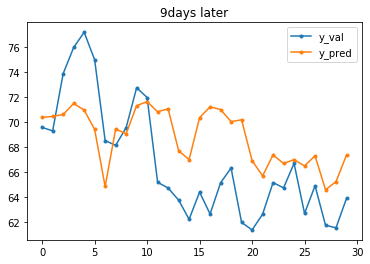

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 4.0775
[400]	valid_0's l1: 4.06855
[600]	valid_0's l1: 4.06572
[800]	valid_0's l1: 4.06464
Early stopping, best iteration is:
[37]	valid_0's l1: 3.95305


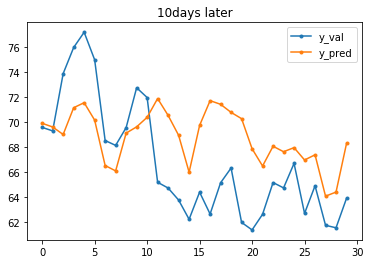

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 4.1185
[400]	valid_0's l1: 4.11699
[600]	valid_0's l1: 4.11427
[800]	valid_0's l1: 4.11311
Early stopping, best iteration is:
[37]	valid_0's l1: 3.93946


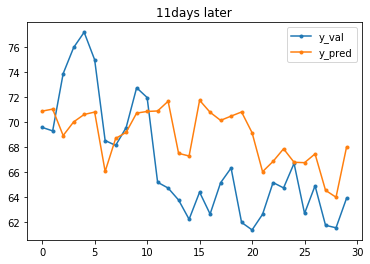

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.95194
[400]	valid_0's l1: 3.94807
[600]	valid_0's l1: 3.94755
[800]	valid_0's l1: 3.94725
Early stopping, best iteration is:
[36]	valid_0's l1: 3.90443


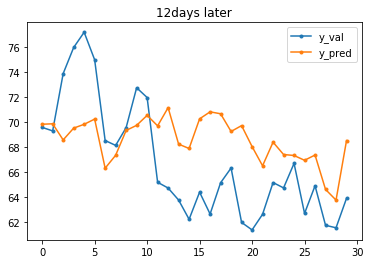

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 4.13592
[400]	valid_0's l1: 4.13406
[600]	valid_0's l1: 4.13184
[800]	valid_0's l1: 4.13092
Early stopping, best iteration is:
[31]	valid_0's l1: 3.90702


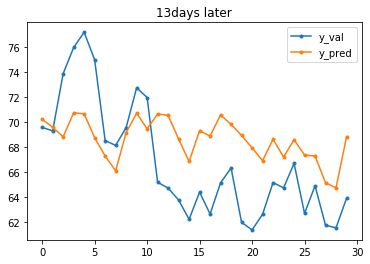

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 4.29048
[400]	valid_0's l1: 4.28405
[600]	valid_0's l1: 4.28266
[800]	valid_0's l1: 4.28136
Early stopping, best iteration is:
[30]	valid_0's l1: 4.09995


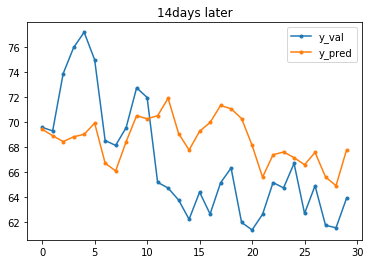

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 4.39629
[400]	valid_0's l1: 4.36969
[600]	valid_0's l1: 4.36404
[800]	valid_0's l1: 4.36392
Early stopping, best iteration is:
[24]	valid_0's l1: 4.21254


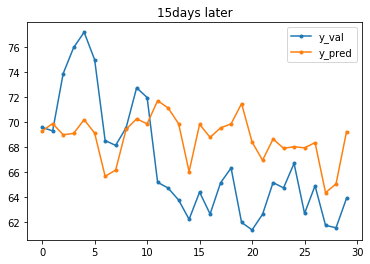

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 4.33025
[400]	valid_0's l1: 4.34963
[600]	valid_0's l1: 4.35129
[800]	valid_0's l1: 4.3518
Early stopping, best iteration is:
[44]	valid_0's l1: 4.14832


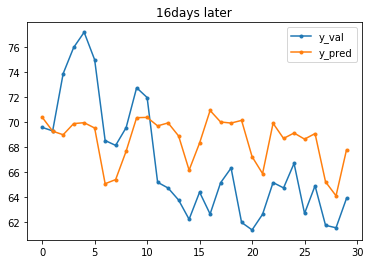

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 4.32229
[400]	valid_0's l1: 4.29166
[600]	valid_0's l1: 4.28365
[800]	valid_0's l1: 4.28033
Early stopping, best iteration is:
[35]	valid_0's l1: 4.2124


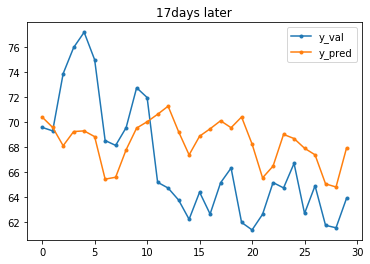

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 4.49383
[400]	valid_0's l1: 4.47639
[600]	valid_0's l1: 4.46748
[800]	valid_0's l1: 4.46434
Early stopping, best iteration is:
[38]	valid_0's l1: 4.40907


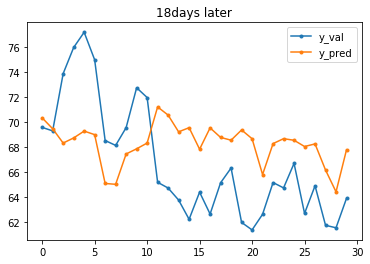

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 4.29644
[400]	valid_0's l1: 4.2634
[600]	valid_0's l1: 4.25426
[800]	valid_0's l1: 4.24896
Early stopping, best iteration is:
[24]	valid_0's l1: 4.24078


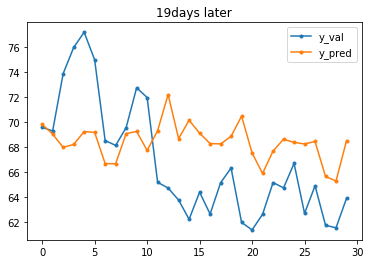

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.9628
[400]	valid_0's l1: 3.96523
[600]	valid_0's l1: 3.96551
[800]	valid_0's l1: 3.96582
Early stopping, best iteration is:
[32]	valid_0's l1: 3.91206


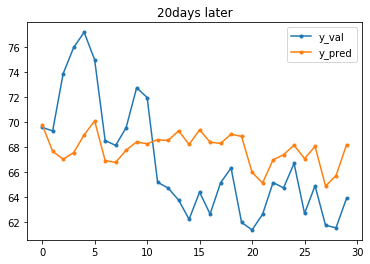

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.97709
[400]	valid_0's l1: 3.9646
[600]	valid_0's l1: 3.95819
[800]	valid_0's l1: 3.95637
Early stopping, best iteration is:
[34]	valid_0's l1: 3.86045


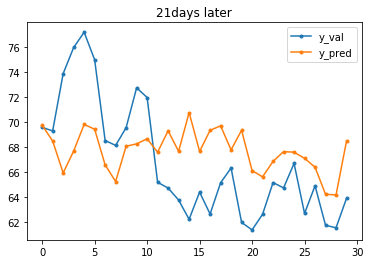

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 4.31377
[400]	valid_0's l1: 4.28714
[600]	valid_0's l1: 4.27479
[800]	valid_0's l1: 4.26818
Early stopping, best iteration is:
[36]	valid_0's l1: 4.22529


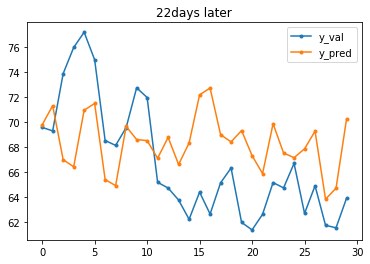

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 4.16927
[400]	valid_0's l1: 4.10537
[600]	valid_0's l1: 4.0859
[800]	valid_0's l1: 4.07812
[1000]	valid_0's l1: 4.07484
[1200]	valid_0's l1: 4.07301
Did not meet early stopping. Best iteration is:
[1199]	valid_0's l1: 4.07297


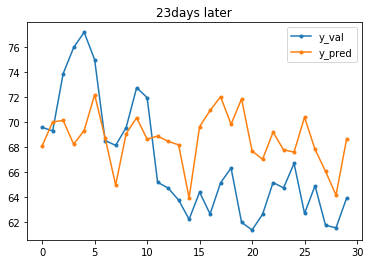

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 4.15457
[400]	valid_0's l1: 4.09923
[600]	valid_0's l1: 4.07975
[800]	valid_0's l1: 4.0732
[1000]	valid_0's l1: 4.06821
[1200]	valid_0's l1: 4.06569
Did not meet early stopping. Best iteration is:
[1197]	valid_0's l1: 4.06556


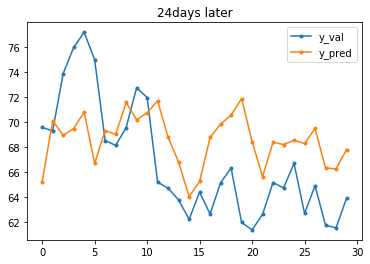

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.98959
[400]	valid_0's l1: 3.95389
[600]	valid_0's l1: 3.94585
[800]	valid_0's l1: 3.94065
[1000]	valid_0's l1: 3.93708
[1200]	valid_0's l1: 3.93489
Did not meet early stopping. Best iteration is:
[1197]	valid_0's l1: 3.93484


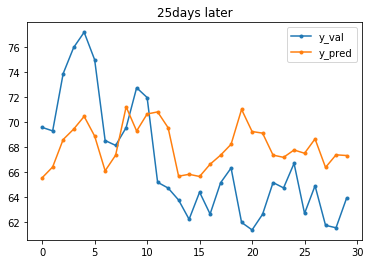

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.65111
[400]	valid_0's l1: 3.61989
[600]	valid_0's l1: 3.60863
[800]	valid_0's l1: 3.60348
[1000]	valid_0's l1: 3.59972
[1200]	valid_0's l1: 3.59788
Did not meet early stopping. Best iteration is:
[1200]	valid_0's l1: 3.59788


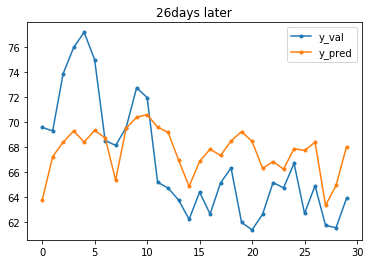

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.62942
[400]	valid_0's l1: 3.61024
[600]	valid_0's l1: 3.60174
[800]	valid_0's l1: 3.59796
Early stopping, best iteration is:
[54]	valid_0's l1: 3.596


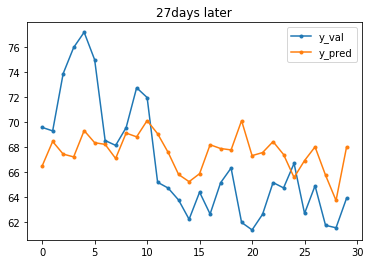

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.42418
[400]	valid_0's l1: 3.40032
[600]	valid_0's l1: 3.38894
[800]	valid_0's l1: 3.38214
[1000]	valid_0's l1: 3.37831
[1200]	valid_0's l1: 3.3765
Did not meet early stopping. Best iteration is:
[1199]	valid_0's l1: 3.37647


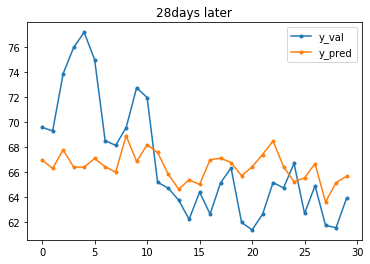

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.6186
[400]	valid_0's l1: 3.58257
[600]	valid_0's l1: 3.56558
[800]	valid_0's l1: 3.5602
[1000]	valid_0's l1: 3.55664
[1200]	valid_0's l1: 3.55451
Did not meet early stopping. Best iteration is:
[1199]	valid_0's l1: 3.5545


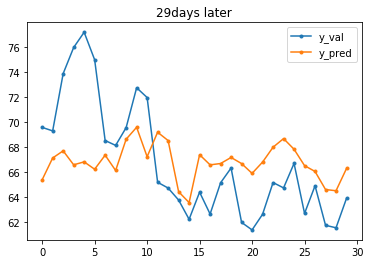

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.99875
[400]	valid_0's l1: 2.95252
[600]	valid_0's l1: 2.93282
[800]	valid_0's l1: 2.92491
[1000]	valid_0's l1: 2.92019
[1200]	valid_0's l1: 2.91804
Did not meet early stopping. Best iteration is:
[1200]	valid_0's l1: 2.91804


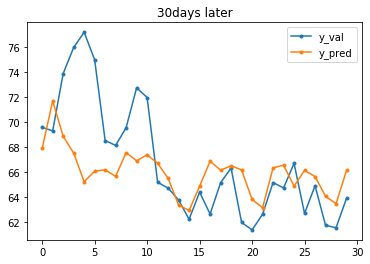

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.12631
[400]	valid_0's l1: 3.12739
[600]	valid_0's l1: 3.12818
[800]	valid_0's l1: 3.12767
Early stopping, best iteration is:
[95]	valid_0's l1: 3.11371


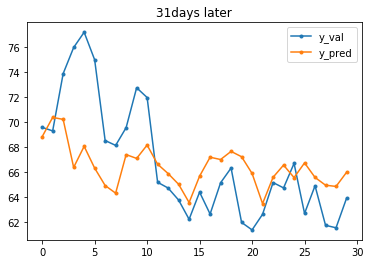

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.29629
[400]	valid_0's l1: 3.29509
[600]	valid_0's l1: 3.29545
[800]	valid_0's l1: 3.29538
Early stopping, best iteration is:
[51]	valid_0's l1: 3.21967


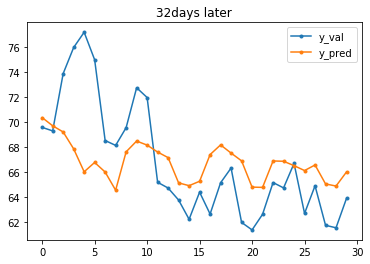

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.79171
[400]	valid_0's l1: 2.7968
[600]	valid_0's l1: 2.79844
[800]	valid_0's l1: 2.7988
Early stopping, best iteration is:
[60]	valid_0's l1: 2.71773


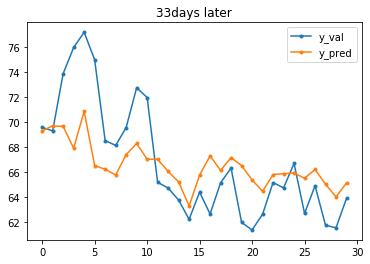

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.71998
[400]	valid_0's l1: 2.72006
[600]	valid_0's l1: 2.72037
[800]	valid_0's l1: 2.71999
Early stopping, best iteration is:
[45]	valid_0's l1: 2.66407


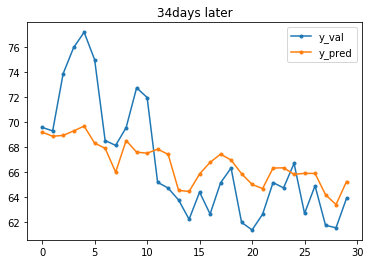

In [12]:
y_columns = ['supply']
supply_models = {}
scores = list()

# 7일~34일 후를 예측하는 각각의 모델 구축
for future in range(7, 35):
    train_split = target.shape[0]-past-future-30 # 마지막 30일을 validation set으로 사용
    x_train, y_train = trans(target, 0, train_split, past, future, x_columns, y_columns)
    x_val, y_val = trans(target, train_split, None, past, future, x_columns, y_columns)

    supply_models[future] = create_model(x_train, y_train, x_val, y_val)
    
    pred = supply_models[future].predict(x_val)
    
    plt.rcParams['figure.figsize'] = [6, 4]
    plt.plot(np.array(y_val), '.-', label='y_val')
    plt.plot(pred, '.-', label='y_pred')
    plt.title(str(future)+'days later')
    plt.legend()
    plt.show()
    
    score = dict(supply_models[future].best_score)['valid_0']['l1']
    scores.append(score)
    print('==========================================================================')

In [13]:
print("mean", sum(scores) / len(scores))
print("min", min(scores))
print("max", max(scores))

mean 3.744119492070999
min 2.6640742580778976
max 4.409073724835693


# Temp

In [14]:
temp_x_columns = ['temp_max', 'temp_min', 'temp_mean', \
                  'sfctemp_max', 'sfctemp_min', 'sfctemp_mean', \
                  'year', 'month', 'day']

## Max

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.07196
[400]	valid_0's l1: 2.07036
[600]	valid_0's l1: 2.06963
[800]	valid_0's l1: 2.0694
Early stopping, best iteration is:
[9]	valid_0's l1: 1.83628


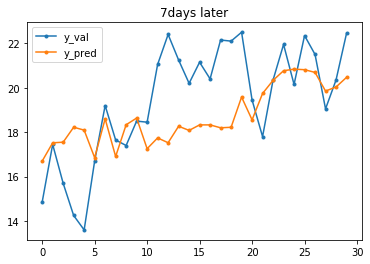

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.24341
[400]	valid_0's l1: 2.24422
[600]	valid_0's l1: 2.24382
[800]	valid_0's l1: 2.24356
Early stopping, best iteration is:
[23]	valid_0's l1: 1.99869


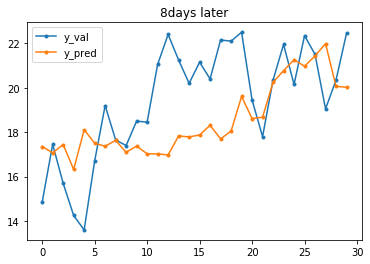

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.35316
[400]	valid_0's l1: 2.35524
[600]	valid_0's l1: 2.35405
[800]	valid_0's l1: 2.35398
Early stopping, best iteration is:
[5]	valid_0's l1: 2.07046


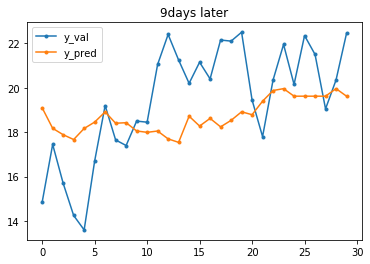

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.27847
[400]	valid_0's l1: 2.27874
[600]	valid_0's l1: 2.27881
[800]	valid_0's l1: 2.27883
Early stopping, best iteration is:
[9]	valid_0's l1: 2.0113


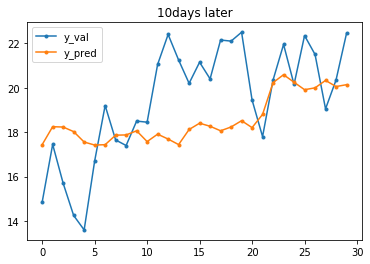

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.42321
[400]	valid_0's l1: 2.42339
[600]	valid_0's l1: 2.4239
[800]	valid_0's l1: 2.42392
Early stopping, best iteration is:
[3]	valid_0's l1: 2.07309


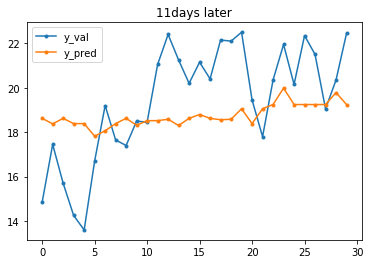

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.50564
[400]	valid_0's l1: 2.50253
[600]	valid_0's l1: 2.50338
[800]	valid_0's l1: 2.50342
Early stopping, best iteration is:
[3]	valid_0's l1: 2.06471


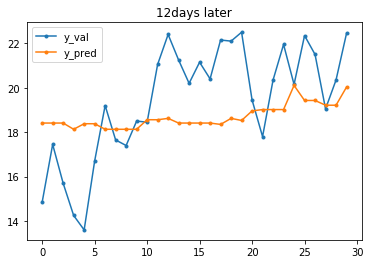

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.52994
[400]	valid_0's l1: 2.53533
[600]	valid_0's l1: 2.5388
[800]	valid_0's l1: 2.53981
Early stopping, best iteration is:
[1]	valid_0's l1: 2.08683


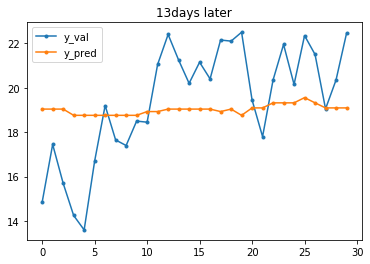

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.4426
[400]	valid_0's l1: 2.44891
[600]	valid_0's l1: 2.4507
[800]	valid_0's l1: 2.45086
Early stopping, best iteration is:
[3]	valid_0's l1: 2.12024


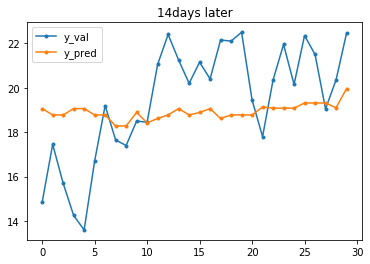

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.09462
[400]	valid_0's l1: 2.09663
[600]	valid_0's l1: 2.09786
[800]	valid_0's l1: 2.09828
Early stopping, best iteration is:
[12]	valid_0's l1: 2.02847


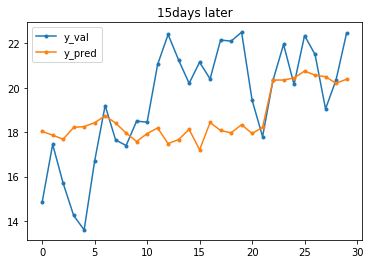

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.1346
[400]	valid_0's l1: 2.13876
[600]	valid_0's l1: 2.13843
[800]	valid_0's l1: 2.13833
Early stopping, best iteration is:
[12]	valid_0's l1: 1.94757


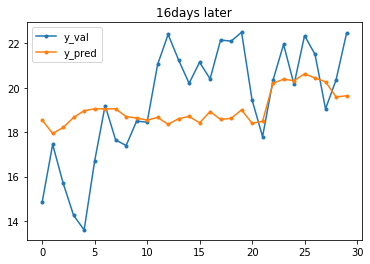

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.09119
[400]	valid_0's l1: 2.09933
[600]	valid_0's l1: 2.10135
[800]	valid_0's l1: 2.10198
Early stopping, best iteration is:
[18]	valid_0's l1: 2.01528


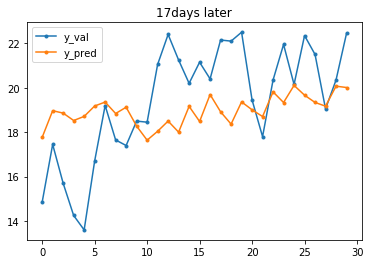

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.3453
[400]	valid_0's l1: 2.36644
[600]	valid_0's l1: 2.37391
[800]	valid_0's l1: 2.37629
Early stopping, best iteration is:
[7]	valid_0's l1: 2.12349


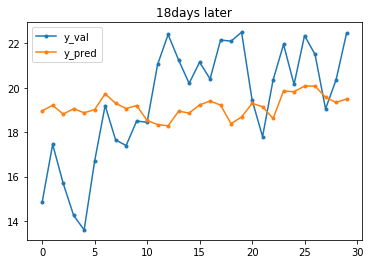

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.1568
[400]	valid_0's l1: 2.16219
[600]	valid_0's l1: 2.16221
[800]	valid_0's l1: 2.16233
Early stopping, best iteration is:
[5]	valid_0's l1: 2.10398


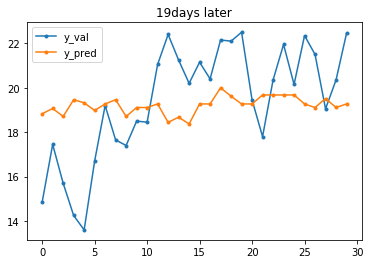

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.11088
[400]	valid_0's l1: 2.1114
[600]	valid_0's l1: 2.1114
[800]	valid_0's l1: 2.11155
Early stopping, best iteration is:
[13]	valid_0's l1: 1.99394


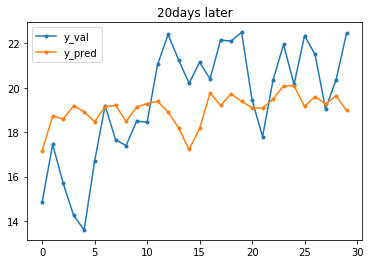

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.03932
[400]	valid_0's l1: 2.03973
[600]	valid_0's l1: 2.03939
[800]	valid_0's l1: 2.03929
Early stopping, best iteration is:
[157]	valid_0's l1: 2.03881


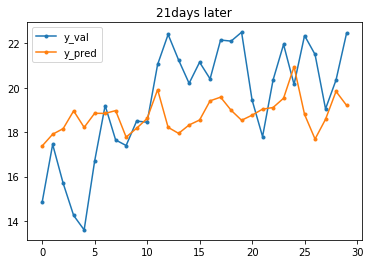

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.30937
[400]	valid_0's l1: 2.29418
[600]	valid_0's l1: 2.28477
[800]	valid_0's l1: 2.28084
Early stopping, best iteration is:
[2]	valid_0's l1: 2.15668


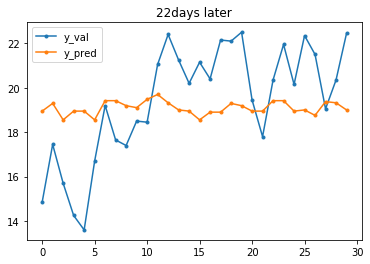

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.46912
[400]	valid_0's l1: 2.46217
[600]	valid_0's l1: 2.46123
[800]	valid_0's l1: 2.46106
Early stopping, best iteration is:
[1]	valid_0's l1: 2.12607


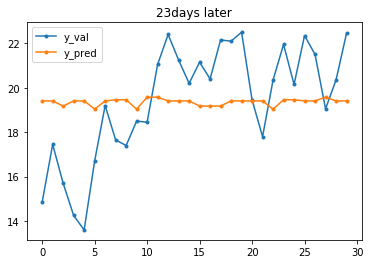

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.06501
[400]	valid_0's l1: 2.06524
[600]	valid_0's l1: 2.06285
[800]	valid_0's l1: 2.0619
Early stopping, best iteration is:
[86]	valid_0's l1: 2.05066


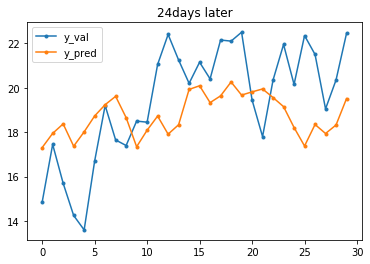

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 1.84783
[400]	valid_0's l1: 1.84427
[600]	valid_0's l1: 1.84151
[800]	valid_0's l1: 1.84067
Early stopping, best iteration is:
[96]	valid_0's l1: 1.83883


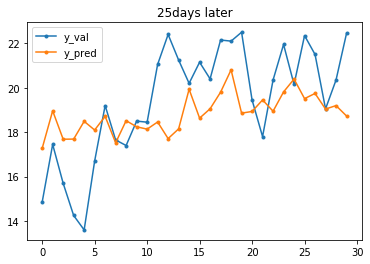

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 1.85874
[400]	valid_0's l1: 1.83936
[600]	valid_0's l1: 1.82998
[800]	valid_0's l1: 1.82834
[1000]	valid_0's l1: 1.82777
[1200]	valid_0's l1: 1.82753
Did not meet early stopping. Best iteration is:
[1197]	valid_0's l1: 1.82752


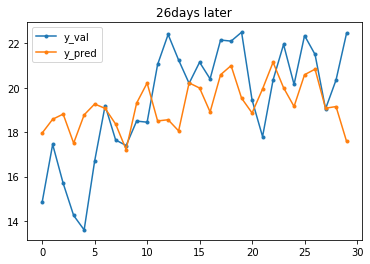

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 1.80514
[400]	valid_0's l1: 1.78769
[600]	valid_0's l1: 1.77931
[800]	valid_0's l1: 1.77559
[1000]	valid_0's l1: 1.77398
[1200]	valid_0's l1: 1.7733
Did not meet early stopping. Best iteration is:
[1199]	valid_0's l1: 1.7733


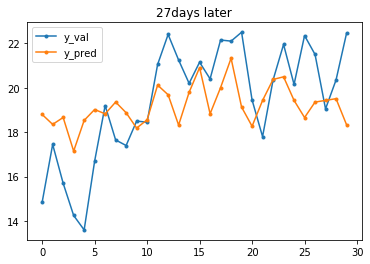

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 1.56288
[400]	valid_0's l1: 1.56147
[600]	valid_0's l1: 1.56168
[800]	valid_0's l1: 1.56182
Early stopping, best iteration is:
[58]	valid_0's l1: 1.54491


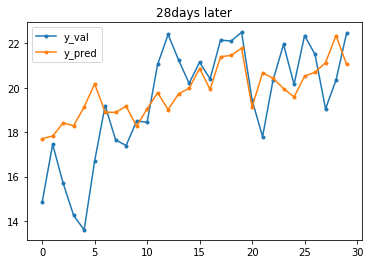

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 1.68876
[400]	valid_0's l1: 1.6956
[600]	valid_0's l1: 1.69638
[800]	valid_0's l1: 1.69694
Early stopping, best iteration is:
[55]	valid_0's l1: 1.63491


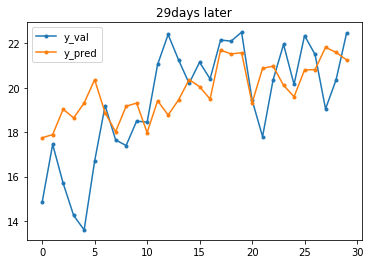

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 1.64774
[400]	valid_0's l1: 1.64793
[600]	valid_0's l1: 1.64903
[800]	valid_0's l1: 1.64928
Early stopping, best iteration is:
[60]	valid_0's l1: 1.59153


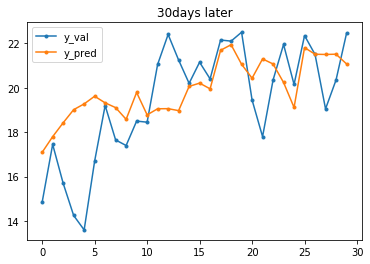

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 1.69253
[400]	valid_0's l1: 1.69275
[600]	valid_0's l1: 1.69466
[800]	valid_0's l1: 1.69565
Early stopping, best iteration is:
[76]	valid_0's l1: 1.65753


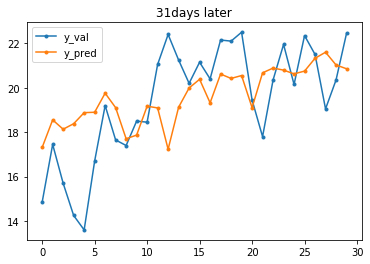

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 1.69976
[400]	valid_0's l1: 1.70019
[600]	valid_0's l1: 1.70074
[800]	valid_0's l1: 1.70106
Early stopping, best iteration is:
[71]	valid_0's l1: 1.67673


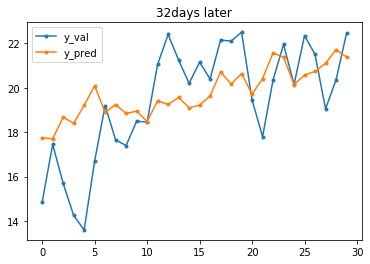

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 1.80656
[400]	valid_0's l1: 1.80907
[600]	valid_0's l1: 1.80955
[800]	valid_0's l1: 1.80878
Early stopping, best iteration is:
[17]	valid_0's l1: 1.74772


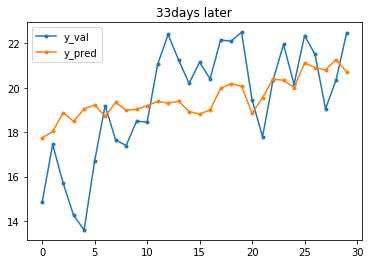

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 1.66336
[400]	valid_0's l1: 1.65788
[600]	valid_0's l1: 1.65737
[800]	valid_0's l1: 1.65763
[1000]	valid_0's l1: 1.65768
[1200]	valid_0's l1: 1.6577
Did not meet early stopping. Best iteration is:
[545]	valid_0's l1: 1.65706


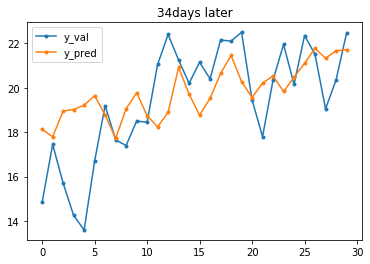

In [15]:
y_columns = ['temp_max']
temp_max_models = {}
scores = list()

# 7일~34일 후를 예측하는 각각의 모델 구축
for future in range(7, 35):
    train_split = target.shape[0]-past-future-30
    x_train, y_train = trans(target, 0, train_split, past, future, temp_x_columns, y_columns)
    x_val, y_val = trans(target, train_split, None, past, future, temp_x_columns, y_columns)
    
    temp_max_models[future] = create_model(x_train, y_train, x_val, y_val)
        
    pred = temp_max_models[future].predict(x_val)
    
    plt.rcParams['figure.figsize'] = [6, 4]
    plt.plot(np.array(y_val), '.-', label='y_val')
    plt.plot(pred, '.-', label='y_pred')
    plt.title(str(future)+'days later')
    plt.legend()
    plt.show()
    
    score = dict(temp_max_models[future].best_score)['valid_0']['l1']
    scores.append(score)
    print('==========================================================================')

In [16]:
print("mean", sum(scores) / len(scores))
print("min", min(scores))
print("max", max(scores))

mean 1.9213066112713744
min 1.5449128636557272
max 2.1566764613566067


## temp min

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.0619
[400]	valid_0's l1: 2.06419
[600]	valid_0's l1: 2.06392
[800]	valid_0's l1: 2.06382
Early stopping, best iteration is:
[15]	valid_0's l1: 1.98765


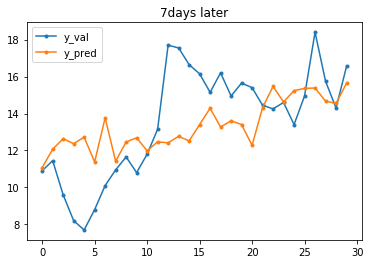

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.12576
[400]	valid_0's l1: 2.12755
[600]	valid_0's l1: 2.1278
[800]	valid_0's l1: 2.12799
Early stopping, best iteration is:
[31]	valid_0's l1: 2.10659


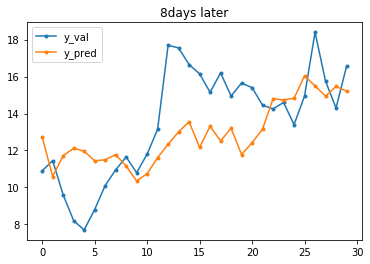

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.24785
[400]	valid_0's l1: 2.24532
[600]	valid_0's l1: 2.24559
[800]	valid_0's l1: 2.24562
Early stopping, best iteration is:
[16]	valid_0's l1: 2.13438


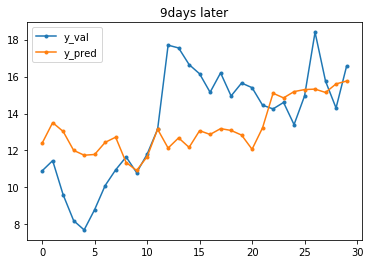

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.22578
[400]	valid_0's l1: 2.22848
[600]	valid_0's l1: 2.22875
[800]	valid_0's l1: 2.22865
Early stopping, best iteration is:
[29]	valid_0's l1: 2.13869


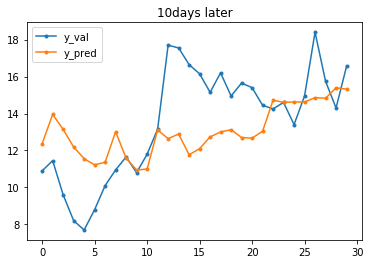

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.51928
[400]	valid_0's l1: 2.51639
[600]	valid_0's l1: 2.51615
[800]	valid_0's l1: 2.51576
Early stopping, best iteration is:
[7]	valid_0's l1: 2.33047


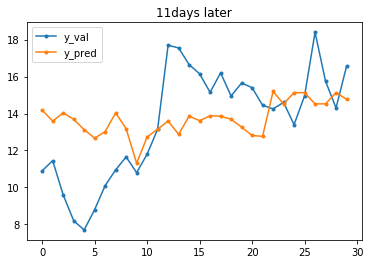

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.37363
[400]	valid_0's l1: 2.36799
[600]	valid_0's l1: 2.36663
[800]	valid_0's l1: 2.3656
Early stopping, best iteration is:
[13]	valid_0's l1: 2.19004


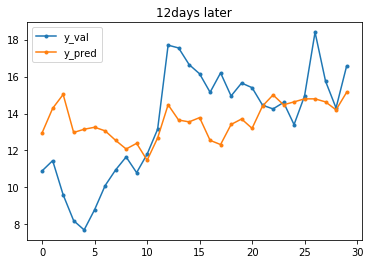

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.51983
[400]	valid_0's l1: 2.51913
[600]	valid_0's l1: 2.51812
[800]	valid_0's l1: 2.51629
Early stopping, best iteration is:
[10]	valid_0's l1: 2.34134


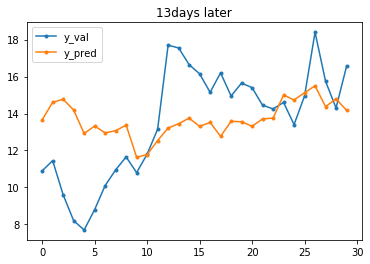

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.46535
[400]	valid_0's l1: 2.46178
[600]	valid_0's l1: 2.45993
[800]	valid_0's l1: 2.45854
Early stopping, best iteration is:
[13]	valid_0's l1: 2.33289


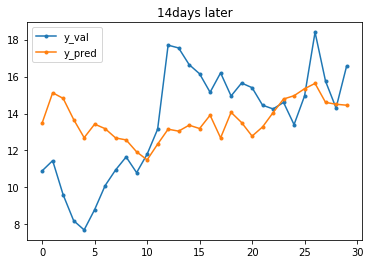

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.46248
[400]	valid_0's l1: 2.45832
[600]	valid_0's l1: 2.45714
[800]	valid_0's l1: 2.45658
Early stopping, best iteration is:
[6]	valid_0's l1: 2.37577


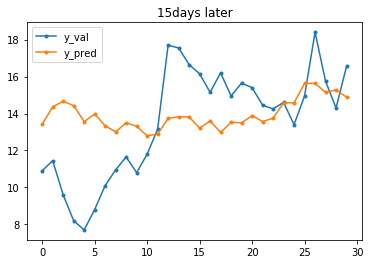

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.64473
[400]	valid_0's l1: 2.63727
[600]	valid_0's l1: 2.63584
[800]	valid_0's l1: 2.6347
Early stopping, best iteration is:
[11]	valid_0's l1: 2.4328


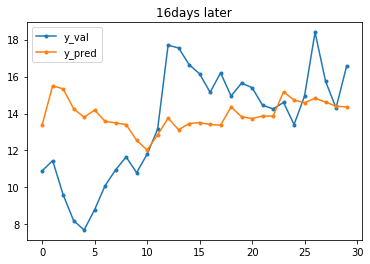

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.59478
[400]	valid_0's l1: 2.59648
[600]	valid_0's l1: 2.59636
[800]	valid_0's l1: 2.59608
Early stopping, best iteration is:
[7]	valid_0's l1: 2.43748


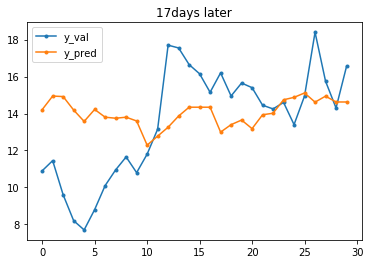

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.41004
[400]	valid_0's l1: 2.4048
[600]	valid_0's l1: 2.40489
[800]	valid_0's l1: 2.40479
Early stopping, best iteration is:
[9]	valid_0's l1: 2.35262


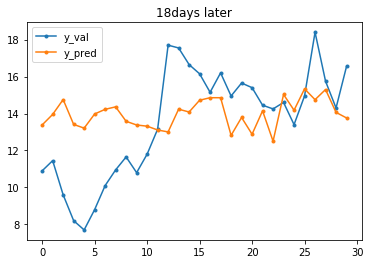

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.49798
[400]	valid_0's l1: 2.49243
[600]	valid_0's l1: 2.49142
[800]	valid_0's l1: 2.49154
Early stopping, best iteration is:
[3]	valid_0's l1: 2.39016


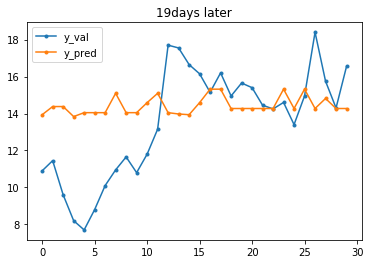

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.36439
[400]	valid_0's l1: 2.36421
[600]	valid_0's l1: 2.36477
[800]	valid_0's l1: 2.36496
Early stopping, best iteration is:
[90]	valid_0's l1: 2.35314


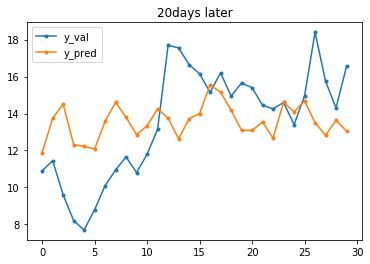

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.33631
[400]	valid_0's l1: 2.3314
[600]	valid_0's l1: 2.33286
[800]	valid_0's l1: 2.33386
[1000]	valid_0's l1: 2.33422
Early stopping, best iteration is:
[383]	valid_0's l1: 2.3311


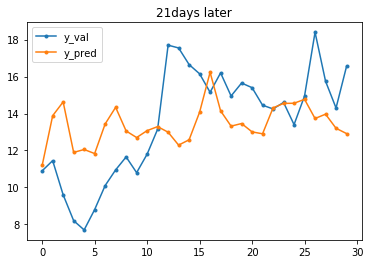

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.28775
[400]	valid_0's l1: 2.29364
[600]	valid_0's l1: 2.29206
[800]	valid_0's l1: 2.29154
Early stopping, best iteration is:
[177]	valid_0's l1: 2.28693


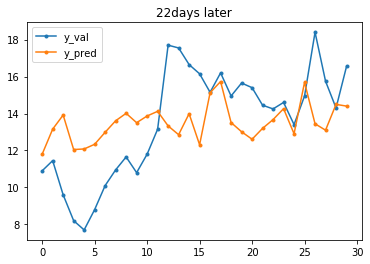

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.11561
[400]	valid_0's l1: 2.11645
[600]	valid_0's l1: 2.11676
[800]	valid_0's l1: 2.11762
Early stopping, best iteration is:
[121]	valid_0's l1: 2.10451


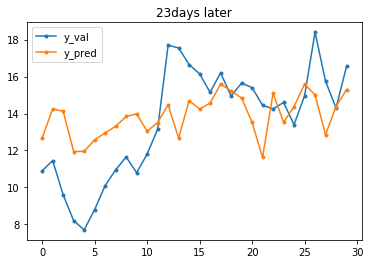

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.1588
[400]	valid_0's l1: 2.15761
[600]	valid_0's l1: 2.15634
[800]	valid_0's l1: 2.15638
Early stopping, best iteration is:
[158]	valid_0's l1: 2.1516


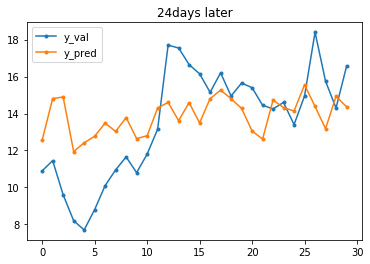

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.11585
[400]	valid_0's l1: 2.10544
[600]	valid_0's l1: 2.10531
[800]	valid_0's l1: 2.10427
Early stopping, best iteration is:
[78]	valid_0's l1: 2.09953


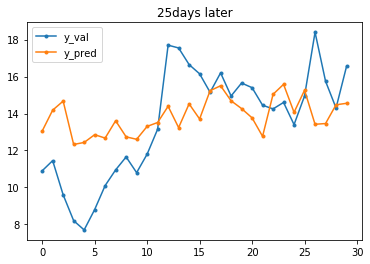

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.14802
[400]	valid_0's l1: 2.14413
[600]	valid_0's l1: 2.14372
[800]	valid_0's l1: 2.14286
Early stopping, best iteration is:
[35]	valid_0's l1: 2.11993


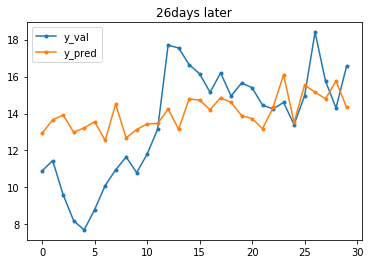

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 1.8985
[400]	valid_0's l1: 1.89397
[600]	valid_0's l1: 1.8945
[800]	valid_0's l1: 1.89477
Early stopping, best iteration is:
[113]	valid_0's l1: 1.87687


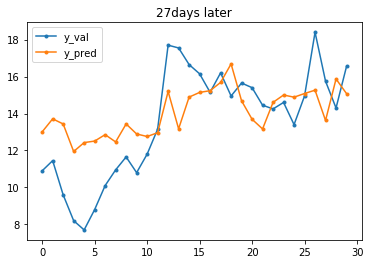

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.01422
[400]	valid_0's l1: 2.00384
[600]	valid_0's l1: 2.00083
[800]	valid_0's l1: 2.00062
Early stopping, best iteration is:
[88]	valid_0's l1: 1.9946


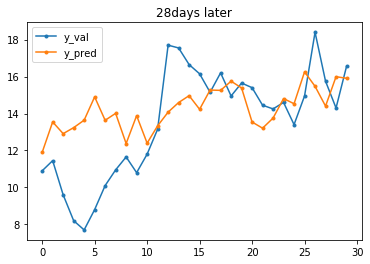

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.03793
[400]	valid_0's l1: 2.02855
[600]	valid_0's l1: 2.02708
[800]	valid_0's l1: 2.02564
[1000]	valid_0's l1: 2.02542
[1200]	valid_0's l1: 2.02468
Did not meet early stopping. Best iteration is:
[1195]	valid_0's l1: 2.02466


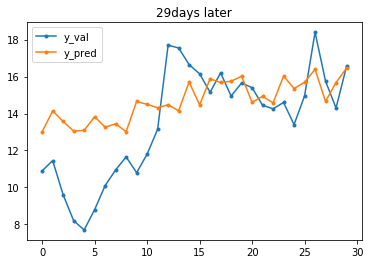

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.18076
[400]	valid_0's l1: 2.17321
[600]	valid_0's l1: 2.17209
[800]	valid_0's l1: 2.17036
Early stopping, best iteration is:
[38]	valid_0's l1: 2.15392


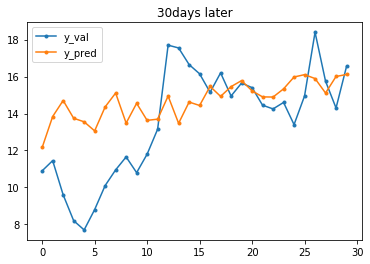

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.21678
[400]	valid_0's l1: 2.21312
[600]	valid_0's l1: 2.21128
[800]	valid_0's l1: 2.21051
[1000]	valid_0's l1: 2.21002
[1200]	valid_0's l1: 2.20979
Did not meet early stopping. Best iteration is:
[1200]	valid_0's l1: 2.20979


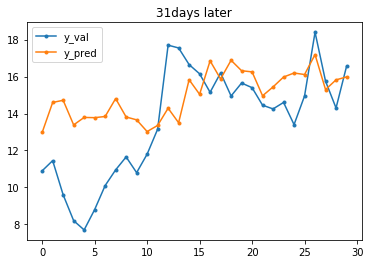

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.12262
[400]	valid_0's l1: 2.12148
[600]	valid_0's l1: 2.12065
[800]	valid_0's l1: 2.11929
Early stopping, best iteration is:
[33]	valid_0's l1: 2.05587


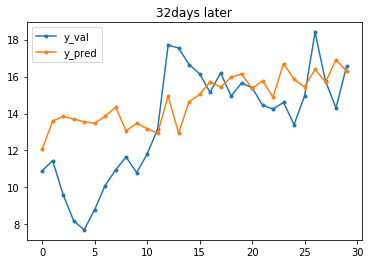

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.11124
[400]	valid_0's l1: 2.10596
[600]	valid_0's l1: 2.10723
[800]	valid_0's l1: 2.10786
Early stopping, best iteration is:
[43]	valid_0's l1: 2.08869


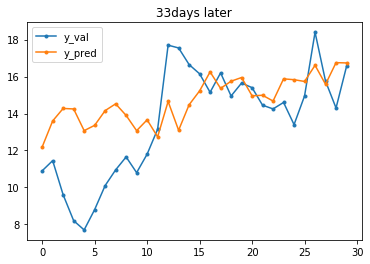

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.19367
[400]	valid_0's l1: 2.18683
[600]	valid_0's l1: 2.18074
[800]	valid_0's l1: 2.17773
Early stopping, best iteration is:
[19]	valid_0's l1: 2.07685


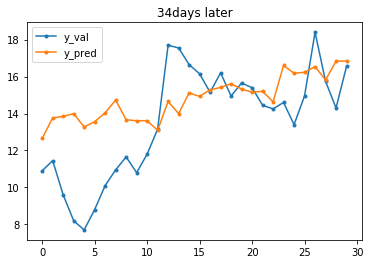

In [17]:
y_columns = ['temp_min']
temp_min_models = {}
scores = list()

# 7일~34일 후를 예측하는 각각의 모델 구축
for future in range(7, 35):
    train_split = target.shape[0]-past-future-30
    x_train, y_train = trans(target, 0, train_split, past, future, temp_x_columns, y_columns)
    x_val, y_val = trans(target, train_split, None, past, future, temp_x_columns, y_columns)
    
    temp_min_models[future] = create_model(x_train, y_train, x_val, y_val)
        
    pred = temp_min_models[future].predict(x_val)
    
    plt.rcParams['figure.figsize'] = [6, 4]
    plt.plot(np.array(y_val), '.-', label='y_val')
    plt.plot(pred, '.-', label='y_pred')
    plt.title(str(future)+'days later')
    plt.legend()
    plt.show()
    
    score = dict(temp_max_models[future].best_score)['valid_0']['l1']
    scores.append(score)
    print('==========================================================================')

In [18]:
print("mean", sum(scores) / len(scores))
print("min", min(scores))
print("max", max(scores))

mean 1.9213066112713744
min 1.5449128636557272
max 2.1566764613566067


# temp mean

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.01942
[400]	valid_0's l1: 2.01595
[600]	valid_0's l1: 2.01481
[800]	valid_0's l1: 2.01457
Early stopping, best iteration is:
[13]	valid_0's l1: 1.93238


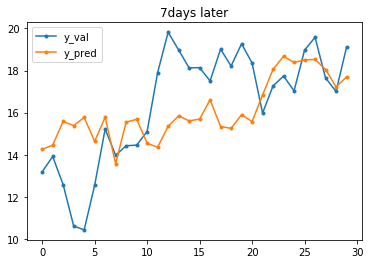

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.28696
[400]	valid_0's l1: 2.28934
[600]	valid_0's l1: 2.28913
[800]	valid_0's l1: 2.28989
Early stopping, best iteration is:
[4]	valid_0's l1: 2.03757


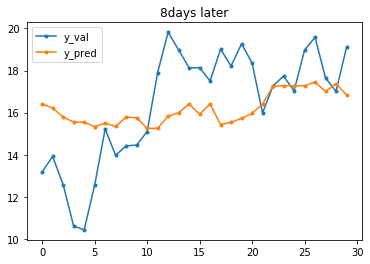

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.01893
[400]	valid_0's l1: 2.01791
[600]	valid_0's l1: 2.0187
[800]	valid_0's l1: 2.01964
Early stopping, best iteration is:
[24]	valid_0's l1: 1.89687


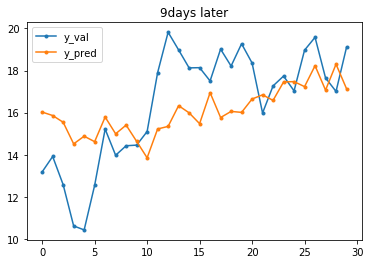

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.0872
[400]	valid_0's l1: 2.08798
[600]	valid_0's l1: 2.08959
[800]	valid_0's l1: 2.09031
Early stopping, best iteration is:
[22]	valid_0's l1: 1.92786


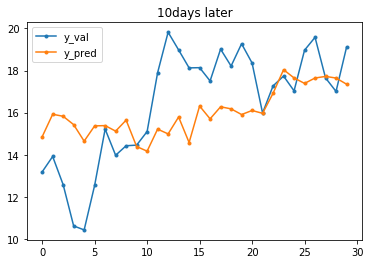

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.33563
[400]	valid_0's l1: 2.3328
[600]	valid_0's l1: 2.33315
[800]	valid_0's l1: 2.33361
Early stopping, best iteration is:
[10]	valid_0's l1: 2.05226


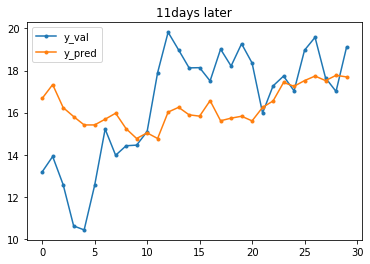

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.24764
[400]	valid_0's l1: 2.24791
[600]	valid_0's l1: 2.24894
[800]	valid_0's l1: 2.2494
Early stopping, best iteration is:
[6]	valid_0's l1: 2.07253


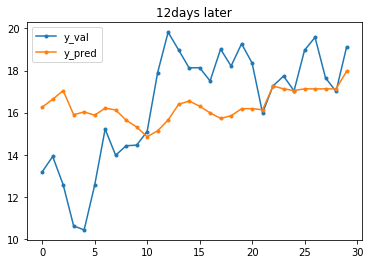

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.21825
[400]	valid_0's l1: 2.21878
[600]	valid_0's l1: 2.22012
[800]	valid_0's l1: 2.22098
Early stopping, best iteration is:
[21]	valid_0's l1: 2.05059


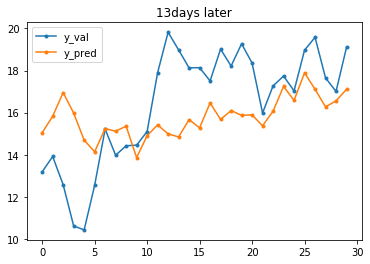

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.53368
[400]	valid_0's l1: 2.53686
[600]	valid_0's l1: 2.5386
[800]	valid_0's l1: 2.53987
Early stopping, best iteration is:
[4]	valid_0's l1: 2.14501


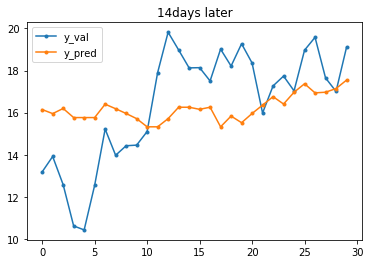

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.36523
[400]	valid_0's l1: 2.36791
[600]	valid_0's l1: 2.36925
[800]	valid_0's l1: 2.36973
Early stopping, best iteration is:
[3]	valid_0's l1: 2.1876


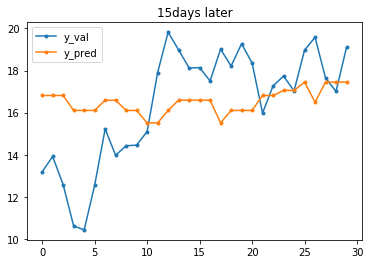

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.49919
[400]	valid_0's l1: 2.50442
[600]	valid_0's l1: 2.50565
[800]	valid_0's l1: 2.50643
Early stopping, best iteration is:
[4]	valid_0's l1: 2.15539


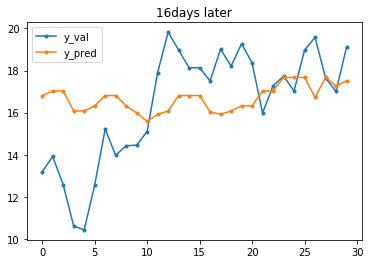

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.44244
[400]	valid_0's l1: 2.44503
[600]	valid_0's l1: 2.44487
[800]	valid_0's l1: 2.44502
Early stopping, best iteration is:
[4]	valid_0's l1: 2.1788


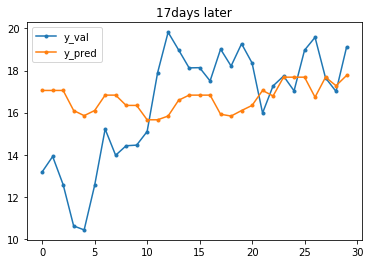

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.34353
[400]	valid_0's l1: 2.34849
[600]	valid_0's l1: 2.34987
[800]	valid_0's l1: 2.35079
Early stopping, best iteration is:
[4]	valid_0's l1: 2.19774


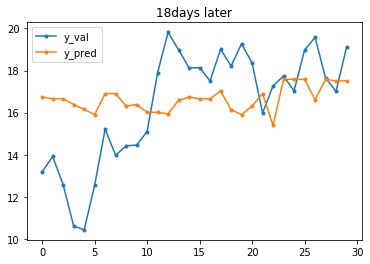

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.1706
[400]	valid_0's l1: 2.16294
[600]	valid_0's l1: 2.16101
[800]	valid_0's l1: 2.15995
Early stopping, best iteration is:
[31]	valid_0's l1: 2.1408


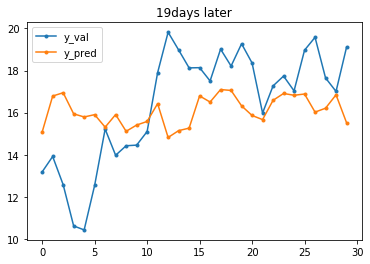

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.21441
[400]	valid_0's l1: 2.20852
[600]	valid_0's l1: 2.20889
[800]	valid_0's l1: 2.20876
Early stopping, best iteration is:
[7]	valid_0's l1: 2.08649


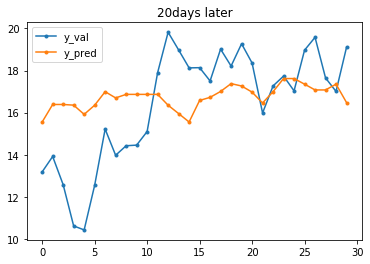

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.05408
[400]	valid_0's l1: 2.05224
[600]	valid_0's l1: 2.05252
[800]	valid_0's l1: 2.05275
Early stopping, best iteration is:
[63]	valid_0's l1: 2.02743


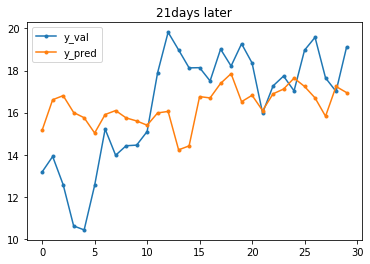

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.16163
[400]	valid_0's l1: 2.15977
[600]	valid_0's l1: 2.16163
[800]	valid_0's l1: 2.16298
Early stopping, best iteration is:
[3]	valid_0's l1: 2.075


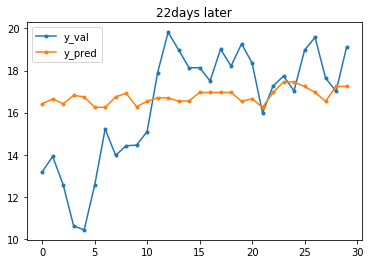

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.29283
[400]	valid_0's l1: 2.29182
[600]	valid_0's l1: 2.29169
[800]	valid_0's l1: 2.29129
Early stopping, best iteration is:
[11]	valid_0's l1: 2.19001


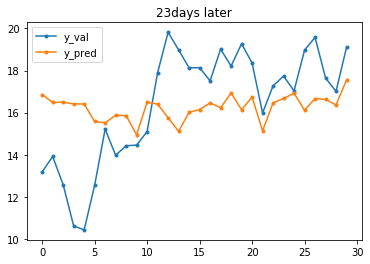

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.02469
[400]	valid_0's l1: 2.02102
[600]	valid_0's l1: 2.01871
[800]	valid_0's l1: 2.0166
Early stopping, best iteration is:
[58]	valid_0's l1: 1.99448


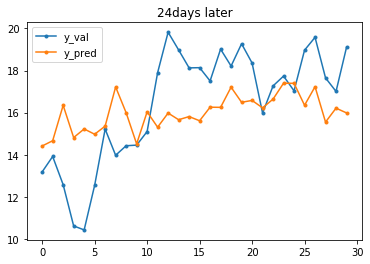

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 1.78292
[400]	valid_0's l1: 1.78491
[600]	valid_0's l1: 1.78358
[800]	valid_0's l1: 1.78383
Early stopping, best iteration is:
[64]	valid_0's l1: 1.72996


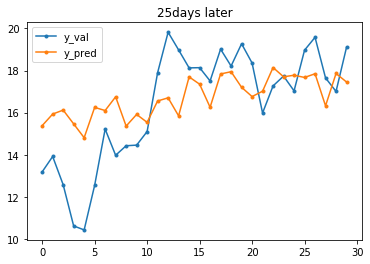

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 1.77974
[400]	valid_0's l1: 1.79786
[600]	valid_0's l1: 1.79997
[800]	valid_0's l1: 1.80178
Early stopping, best iteration is:
[43]	valid_0's l1: 1.70069


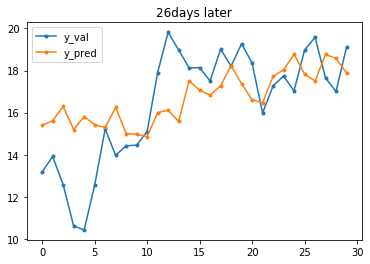

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 1.85486
[400]	valid_0's l1: 1.84881
[600]	valid_0's l1: 1.84853
[800]	valid_0's l1: 1.84992
Early stopping, best iteration is:
[46]	valid_0's l1: 1.77991


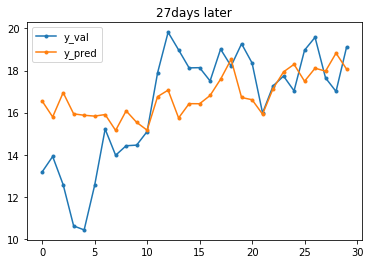

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 1.594
[400]	valid_0's l1: 1.6019
[600]	valid_0's l1: 1.60257
[800]	valid_0's l1: 1.60412
Early stopping, best iteration is:
[38]	valid_0's l1: 1.54129


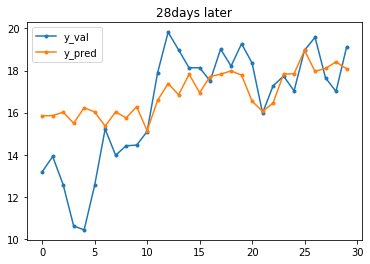

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 1.78615
[400]	valid_0's l1: 1.79406
[600]	valid_0's l1: 1.79472
[800]	valid_0's l1: 1.79533
Early stopping, best iteration is:
[39]	valid_0's l1: 1.67249


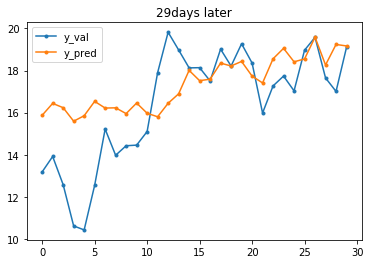

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 1.75992
[400]	valid_0's l1: 1.76193
[600]	valid_0's l1: 1.76267
[800]	valid_0's l1: 1.76437
Early stopping, best iteration is:
[44]	valid_0's l1: 1.67294


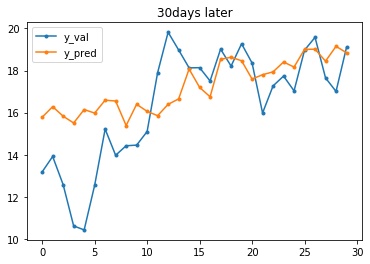

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 1.82398
[400]	valid_0's l1: 1.82624
[600]	valid_0's l1: 1.82834
[800]	valid_0's l1: 1.82973
Early stopping, best iteration is:
[53]	valid_0's l1: 1.76579


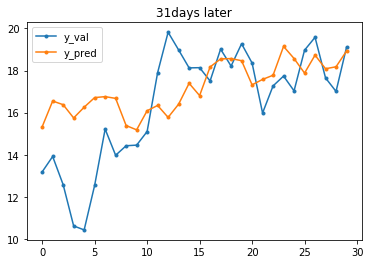

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 1.98695
[400]	valid_0's l1: 1.98195
[600]	valid_0's l1: 1.9807
[800]	valid_0's l1: 1.98075
Early stopping, best iteration is:
[38]	valid_0's l1: 1.90245


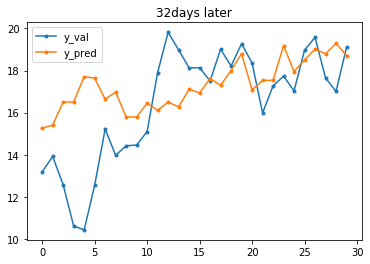

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 1.8854
[400]	valid_0's l1: 1.88191
[600]	valid_0's l1: 1.87928
[800]	valid_0's l1: 1.87821
Early stopping, best iteration is:
[42]	valid_0's l1: 1.76789


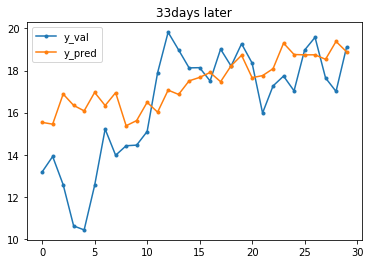

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 1.79353
[400]	valid_0's l1: 1.79633
[600]	valid_0's l1: 1.79836
[800]	valid_0's l1: 1.80033
Early stopping, best iteration is:
[138]	valid_0's l1: 1.79089


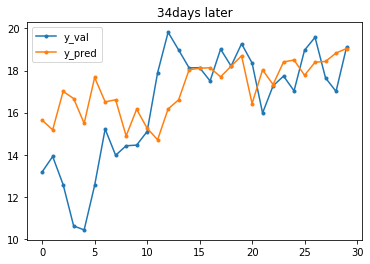

In [19]:
y_columns = ['temp_mean']
temp_mean_models = {}
scores = []

# 7일~34일 후를 예측하는 각각의 모델 구축
for future in range(7, 35):
    train_split = target.shape[0]-past-future-30
    x_train, y_train = trans(target, 0, train_split, past, future, temp_x_columns, y_columns)
    x_val, y_val = trans(target, train_split, None, past, future, temp_x_columns, y_columns)
    
    temp_mean_models[future] = create_model(x_train, y_train, x_val, y_val)
        
    pred = temp_mean_models[future].predict(x_val)
    
    plt.rcParams['figure.figsize'] = [6, 4]
    plt.plot(np.array(y_val), '.-', label='y_val')
    plt.plot(pred, '.-', label='y_pred')
    plt.title(str(future)+'days later')
    plt.legend()
    plt.show()
    
    score = dict(temp_max_models[future].best_score)['valid_0']['l1']
    scores.append(score)
    print('==========================================================================')

In [20]:
print("mean", sum(scores) / len(scores))
print("min", min(scores))
print("max", max(scores))

mean 1.9213066112713744
min 1.5449128636557272
max 2.1566764613566067


# sfctemp

In [21]:
sfctemp_x_columns = ['temp_max', 'temp_min', 'temp_mean', \
                  'sfctemp_max', 'sfctemp_min', 'sfctemp_mean', \
                  'year', 'month', 'day']

In [23]:
def sfctemp_model(x_train, y_train, x_val, y_val):
    params = {
        'metric': 'mae',
        'seed':7777,
        'learning_rate': 0.02
        }
    
    d_train = lgb.Dataset(x_train, y_train)
    d_val = lgb.Dataset(x_val, y_val)

    model = lgb.train(params, d_train, 1200, \
                      d_val, verbose_eval=600, \
                      )
    
    return model

## Max

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 5.15355
[400]	valid_0's l1: 5.14923
[600]	valid_0's l1: 5.14942
[800]	valid_0's l1: 5.14941
Early stopping, best iteration is:
[4]	valid_0's l1: 4.98727


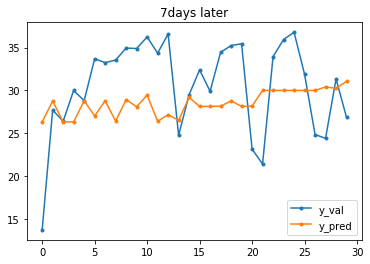

4.987268654358827
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 5.53339
[400]	valid_0's l1: 5.53003
[600]	valid_0's l1: 5.52946
[800]	valid_0's l1: 5.52941
Early stopping, best iteration is:
[7]	valid_0's l1: 4.92179


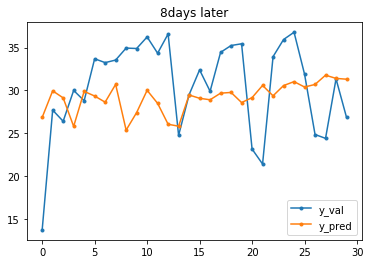

4.921787130463419
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 5.82531
[400]	valid_0's l1: 5.82345
[600]	valid_0's l1: 5.82342
[800]	valid_0's l1: 5.82338
Early stopping, best iteration is:
[4]	valid_0's l1: 4.84926


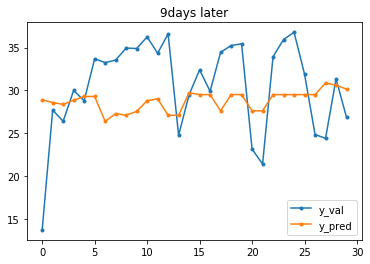

4.849262914010785
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 5.59907
[400]	valid_0's l1: 5.60471
[600]	valid_0's l1: 5.60529
[800]	valid_0's l1: 5.60536
Early stopping, best iteration is:
[7]	valid_0's l1: 5.09438


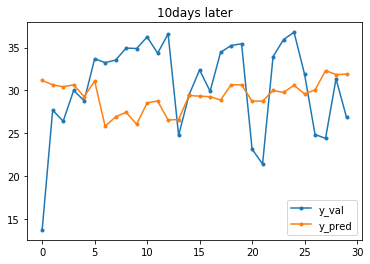

5.094378422652876
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 6.10528
[400]	valid_0's l1: 6.11514
[600]	valid_0's l1: 6.11581
[800]	valid_0's l1: 6.11591
Early stopping, best iteration is:
[3]	valid_0's l1: 5.18909


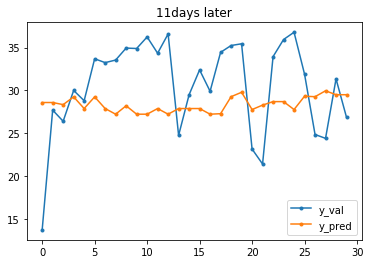

5.1890939854818345
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 5.60794
[400]	valid_0's l1: 5.61342
[600]	valid_0's l1: 5.61316
[800]	valid_0's l1: 5.61319
Early stopping, best iteration is:
[11]	valid_0's l1: 5.18901


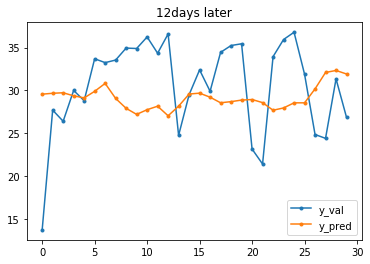

5.189006106804978
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 5.87918
[400]	valid_0's l1: 5.88764
[600]	valid_0's l1: 5.88683
[800]	valid_0's l1: 5.88655
Early stopping, best iteration is:
[1]	valid_0's l1: 5.27682


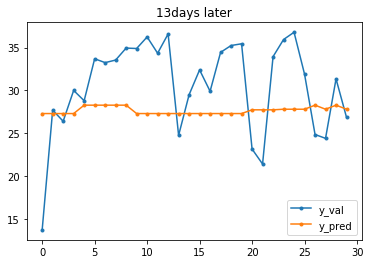

5.276820760312247
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 5.89797
[400]	valid_0's l1: 5.90763
[600]	valid_0's l1: 5.90911
[800]	valid_0's l1: 5.90964
Early stopping, best iteration is:
[14]	valid_0's l1: 5.30497


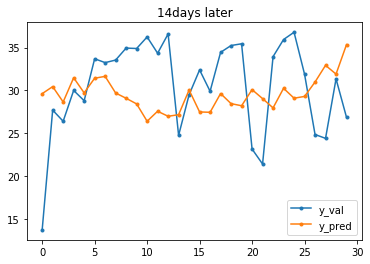

5.304968869537879
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 5.32616
[400]	valid_0's l1: 5.32909
[600]	valid_0's l1: 5.32671
[800]	valid_0's l1: 5.32653
Early stopping, best iteration is:
[17]	valid_0's l1: 5.13346


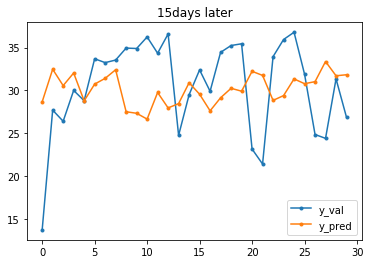

5.1334584349229395
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 5.39949
[400]	valid_0's l1: 5.40451
[600]	valid_0's l1: 5.40478
[800]	valid_0's l1: 5.40492
Early stopping, best iteration is:
[17]	valid_0's l1: 5.0082


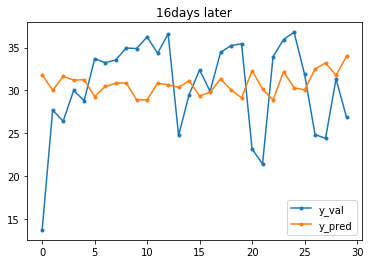

5.008197186897972
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 4.65427
[400]	valid_0's l1: 4.64664
[600]	valid_0's l1: 4.64597
[800]	valid_0's l1: 4.64606
Early stopping, best iteration is:
[4]	valid_0's l1: 4.58291


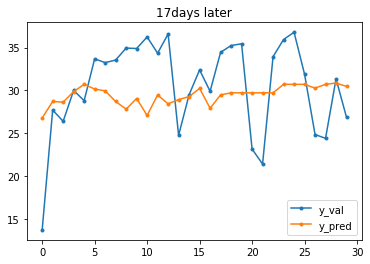

4.582907321280478
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 4.29505
[400]	valid_0's l1: 4.29288
[600]	valid_0's l1: 4.29152
[800]	valid_0's l1: 4.29029
Early stopping, best iteration is:
[54]	valid_0's l1: 4.27012


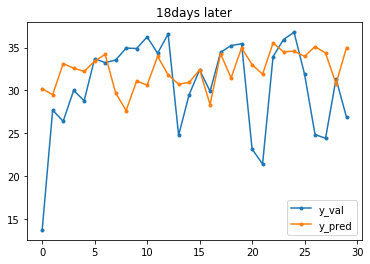

4.270121695818783
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 4.5206
[400]	valid_0's l1: 4.52209
[600]	valid_0's l1: 4.522
[800]	valid_0's l1: 4.5218
Early stopping, best iteration is:
[61]	valid_0's l1: 4.31598


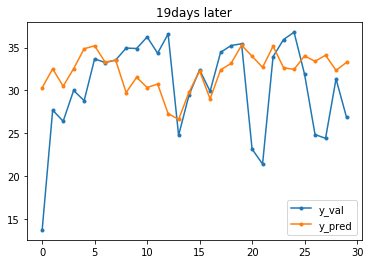

4.315982637864723
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 4.79218
[400]	valid_0's l1: 4.80279
[600]	valid_0's l1: 4.80381
[800]	valid_0's l1: 4.80415
Early stopping, best iteration is:
[20]	valid_0's l1: 4.31233


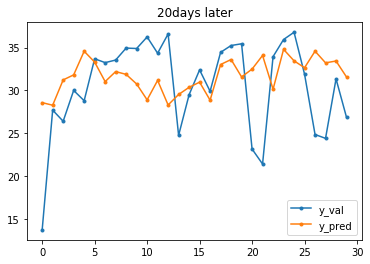

4.312332128269157
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 5.1482
[400]	valid_0's l1: 5.1553
[600]	valid_0's l1: 5.15631
[800]	valid_0's l1: 5.15645
Early stopping, best iteration is:
[9]	valid_0's l1: 4.24405


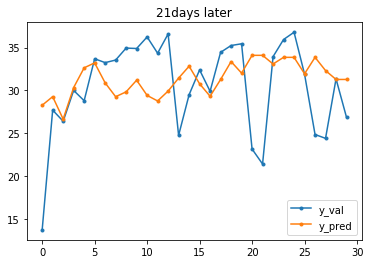

4.244046672480272
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 4.91394
[400]	valid_0's l1: 4.91968
[600]	valid_0's l1: 4.9201
[800]	valid_0's l1: 4.92015
Early stopping, best iteration is:
[11]	valid_0's l1: 4.41045


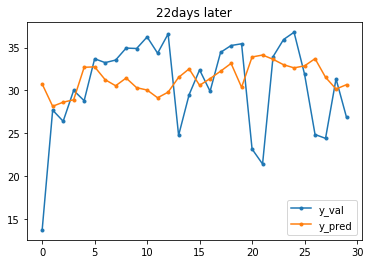

4.410451583784126
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 5.20892
[400]	valid_0's l1: 5.20573
[600]	valid_0's l1: 5.20556
[800]	valid_0's l1: 5.20572
Early stopping, best iteration is:
[15]	valid_0's l1: 4.40192


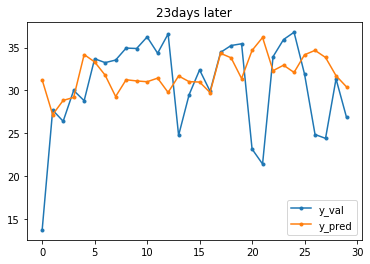

4.401924745000893
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 5.6289
[400]	valid_0's l1: 5.63584
[600]	valid_0's l1: 5.63703
[800]	valid_0's l1: 5.63715
Early stopping, best iteration is:
[6]	valid_0's l1: 4.27377


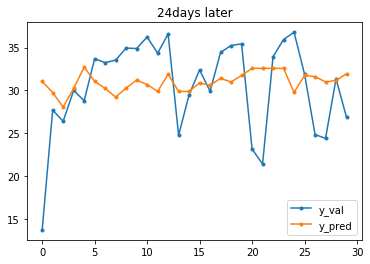

4.273768490278067
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 5.09579
[400]	valid_0's l1: 5.10574
[600]	valid_0's l1: 5.10604
[800]	valid_0's l1: 5.10612
Early stopping, best iteration is:
[14]	valid_0's l1: 4.29436


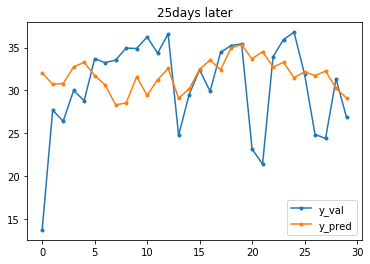

4.294359244315157
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 5.97667
[400]	valid_0's l1: 5.99255
[600]	valid_0's l1: 5.99331
[800]	valid_0's l1: 5.99343
Early stopping, best iteration is:
[13]	valid_0's l1: 4.59132


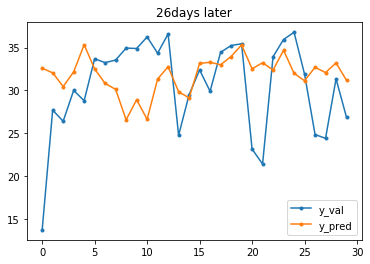

4.5913239852485725
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 5.46409
[400]	valid_0's l1: 5.46424
[600]	valid_0's l1: 5.46421
[800]	valid_0's l1: 5.4643
Early stopping, best iteration is:
[10]	valid_0's l1: 4.65157


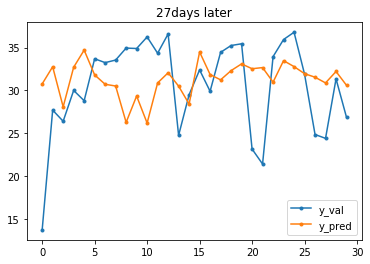

4.651574470454775
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 5.27604
[400]	valid_0's l1: 5.27476
[600]	valid_0's l1: 5.27358
[800]	valid_0's l1: 5.27323
Early stopping, best iteration is:
[11]	valid_0's l1: 4.65499


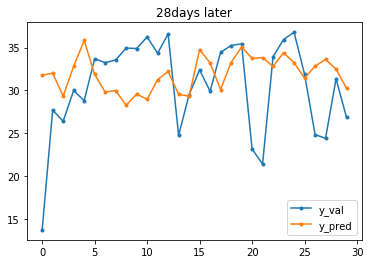

4.654993242646584
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 5.60815
[400]	valid_0's l1: 5.61397
[600]	valid_0's l1: 5.61386
[800]	valid_0's l1: 5.61363
Early stopping, best iteration is:
[8]	valid_0's l1: 4.4993


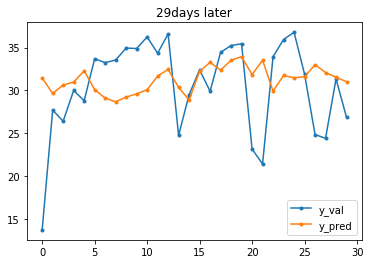

4.499304244455505
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 5.93307
[400]	valid_0's l1: 5.93383
[600]	valid_0's l1: 5.93345
[800]	valid_0's l1: 5.93329
Early stopping, best iteration is:
[9]	valid_0's l1: 4.6109


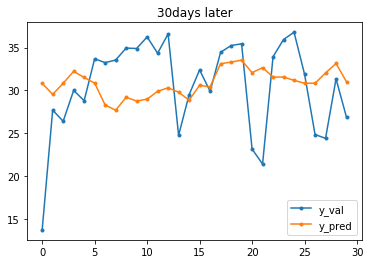

4.61090212980867
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 5.97638
[400]	valid_0's l1: 5.97533
[600]	valid_0's l1: 5.97528
[800]	valid_0's l1: 5.97584
Early stopping, best iteration is:
[7]	valid_0's l1: 4.53488


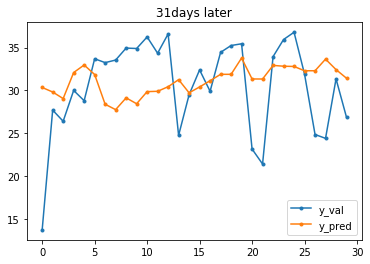

4.534880373010879
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 5.50175
[400]	valid_0's l1: 5.49472
[600]	valid_0's l1: 5.49437
[800]	valid_0's l1: 5.49422
Early stopping, best iteration is:
[4]	valid_0's l1: 4.7955


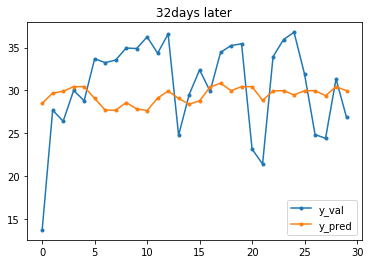

4.795500673973072
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 5.80247
[400]	valid_0's l1: 5.80897
[600]	valid_0's l1: 5.80855
[800]	valid_0's l1: 5.80812
Early stopping, best iteration is:
[3]	valid_0's l1: 4.54757


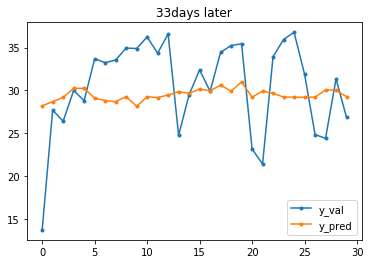

4.547571474990324
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 5.77721
[400]	valid_0's l1: 5.78157
[600]	valid_0's l1: 5.78117
[800]	valid_0's l1: 5.78091
Early stopping, best iteration is:
[7]	valid_0's l1: 4.51042


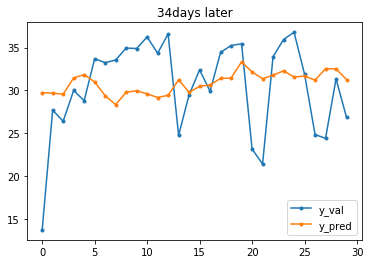

4.510423238165509


In [66]:
y_columns = ['sfctemp_max']
sfctemp_max_models = {}
scores = []

# 7일~34일 후를 예측하는 각각의 모델 구축
for future in range(7, 35):
    train_split = target.shape[0]-past-future-30
    x_train, y_train = trans(target, 0, train_split, past, future, sfctemp_x_columns, y_columns)
    x_val, y_val = trans(target, train_split, None, past, future, sfctemp_x_columns, y_columns)
    
    sfctemp_max_models[future] = create_model(x_train, y_train, x_val, y_val)
    
    pred = sfctemp_max_models[future].predict(x_val)
    
    plt.rcParams['figure.figsize'] = [6, 4]
    plt.plot(np.array(y_val), '.-', label='y_val')
    plt.plot(pred, '.-', label='y_pred')
    plt.title(str(future)+'days later')
    plt.legend()
    plt.show()
    
    score = mean_absolute_error(y_val, pred)
    scores.append(score)
    print(score)
    print('==========================================================================')

In [67]:
print("mean", sum(scores) / len(scores))
print("min", min(scores))
print("max", max(scores))

mean 4.694878957760332
min 4.244046672480272
max 5.304968869537879


## Min

In [72]:
y_columns = ['sfctemp_min']
sfctemp_min_models = {}

# 7일~34일 후를 예측하는 각각의 모델 구축
for future in range(7, 35):
    train_split = target.shape[0]-past-future-30
    x_train, y_train = trans(target, 0, train_split, past, future, sfctemp_x_columns, y_columns)
    x_val, y_val = trans(target, train_split, None, past, future, sfctemp_x_columns, y_columns)
    
    sfctemp_min_models[future] = create_model(x_train, y_train, x_val, y_val)

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.10798
[400]	valid_0's l1: 3.10626
[600]	valid_0's l1: 3.10416
[800]	valid_0's l1: 3.10244
Early stopping, best iteration is:
[11]	valid_0's l1: 3.01057
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.16847
[400]	valid_0's l1: 3.17495
[600]	valid_0's l1: 3.17648
[800]	valid_0's l1: 3.17709
Early stopping, best iteration is:
[14]	valid_0's l1: 3.01258
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.15728
[400]	valid_0's l1: 3.15213
[600]	valid_0's l1: 3.15074
[800]	valid_0's l1: 3.15038
Early stopping, best iteration is:
[26]	valid_0's l1: 2.97407
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.32351
[400]	valid_0's l1: 3.32937
[600]	valid_0's l1: 3.32899
[800]	valid_0's l1: 3.32933
Early stopping, best iteration is:
[8]	valid_0's l1: 3.03529
Training until validation scores don't improve for 800 ro

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.10798
[400]	valid_0's l1: 3.10626
[600]	valid_0's l1: 3.10416
[800]	valid_0's l1: 3.10244
Early stopping, best iteration is:
[11]	valid_0's l1: 3.01057


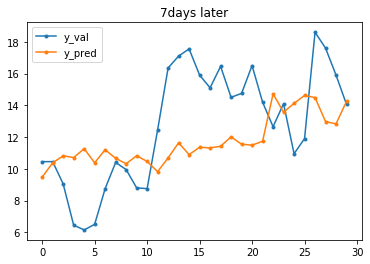

3.0105679817552593
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.16847
[400]	valid_0's l1: 3.17495
[600]	valid_0's l1: 3.17648
[800]	valid_0's l1: 3.17709
Early stopping, best iteration is:
[14]	valid_0's l1: 3.01258


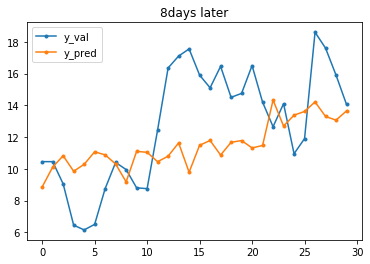

3.0125826255045323
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.15728
[400]	valid_0's l1: 3.15213
[600]	valid_0's l1: 3.15074
[800]	valid_0's l1: 3.15038
Early stopping, best iteration is:
[26]	valid_0's l1: 2.97407


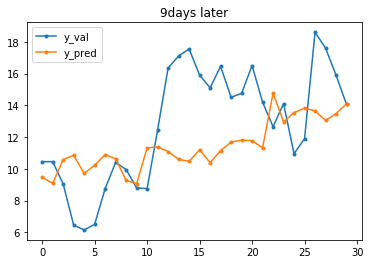

2.974067994342765
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.32351
[400]	valid_0's l1: 3.32937
[600]	valid_0's l1: 3.32899
[800]	valid_0's l1: 3.32933
Early stopping, best iteration is:
[8]	valid_0's l1: 3.03529


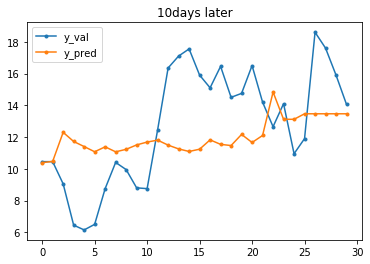

3.0352925834677333
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.35756
[400]	valid_0's l1: 3.36163
[600]	valid_0's l1: 3.36207
[800]	valid_0's l1: 3.36248
Early stopping, best iteration is:
[7]	valid_0's l1: 3.07559


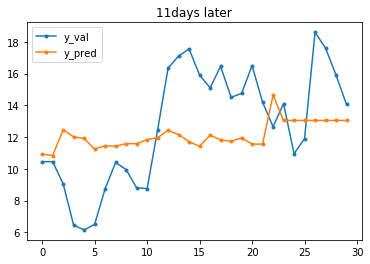

3.0755874338736287
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.41489
[400]	valid_0's l1: 3.40757
[600]	valid_0's l1: 3.40924
[800]	valid_0's l1: 3.40934
Early stopping, best iteration is:
[11]	valid_0's l1: 3.10518


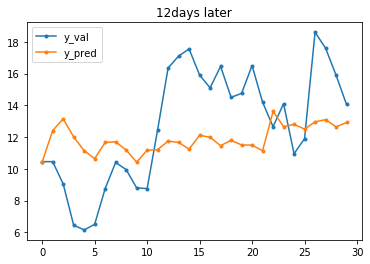

3.1051754077705587
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.41718
[400]	valid_0's l1: 3.41495
[600]	valid_0's l1: 3.41277
[800]	valid_0's l1: 3.41232
Early stopping, best iteration is:
[3]	valid_0's l1: 3.14732


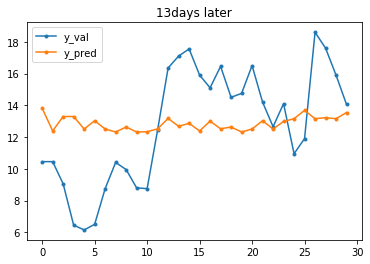

3.147321727049068
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.61229
[400]	valid_0's l1: 3.60177
[600]	valid_0's l1: 3.60122
[800]	valid_0's l1: 3.59968
Early stopping, best iteration is:
[3]	valid_0's l1: 3.15808


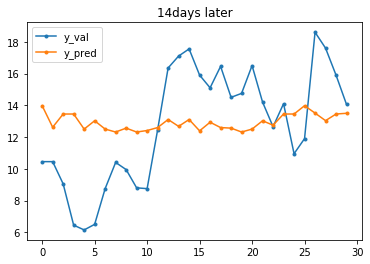

3.158084274210715
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.56575
[400]	valid_0's l1: 3.5549
[600]	valid_0's l1: 3.55635
[800]	valid_0's l1: 3.55664
Early stopping, best iteration is:
[1]	valid_0's l1: 3.1636


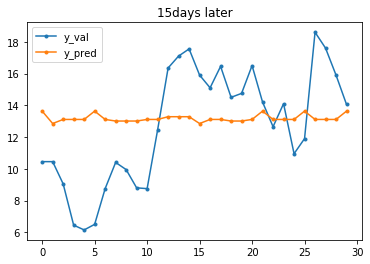

3.163600657457509
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.64496
[400]	valid_0's l1: 3.63495
[600]	valid_0's l1: 3.6351
[800]	valid_0's l1: 3.63654
Early stopping, best iteration is:
[2]	valid_0's l1: 3.16267


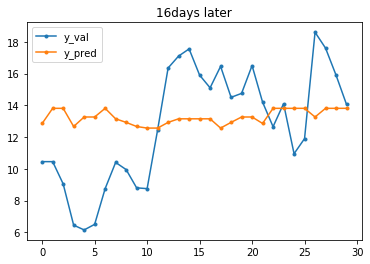

3.1626664526954182
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.5047
[400]	valid_0's l1: 3.50818
[600]	valid_0's l1: 3.50926
[800]	valid_0's l1: 3.51002
Early stopping, best iteration is:
[2]	valid_0's l1: 3.11545


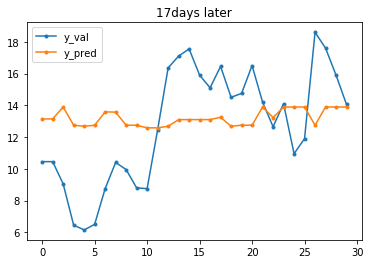

3.1154534595992
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.59233
[400]	valid_0's l1: 3.58152
[600]	valid_0's l1: 3.57917
[800]	valid_0's l1: 3.57852
Early stopping, best iteration is:
[2]	valid_0's l1: 3.04405


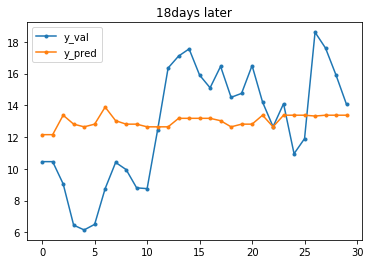

3.04405338725745
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.50906
[400]	valid_0's l1: 3.51006
[600]	valid_0's l1: 3.5102
[800]	valid_0's l1: 3.51093
Early stopping, best iteration is:
[1]	valid_0's l1: 3.15747


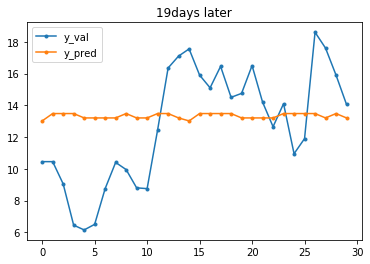

3.1574691353811897
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.00147
[400]	valid_0's l1: 3.00237
[600]	valid_0's l1: 3.00214
[800]	valid_0's l1: 3.00405
Early stopping, best iteration is:
[134]	valid_0's l1: 2.99555


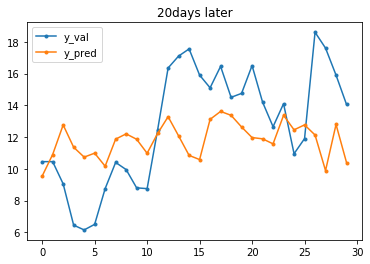

2.9955458983935004
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.32878
[400]	valid_0's l1: 3.33447
[600]	valid_0's l1: 3.33533
[800]	valid_0's l1: 3.33545
Early stopping, best iteration is:
[14]	valid_0's l1: 2.97986


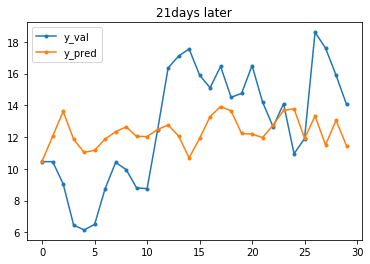

2.9798619787655203
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.315
[400]	valid_0's l1: 3.3193
[600]	valid_0's l1: 3.31922
[800]	valid_0's l1: 3.31933
Early stopping, best iteration is:
[8]	valid_0's l1: 3.09035


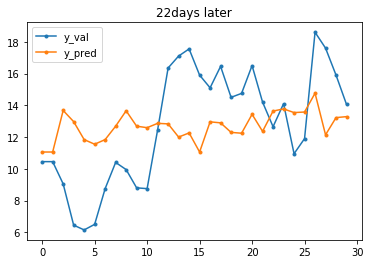

3.0903534912764155
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.04588
[400]	valid_0's l1: 3.05424
[600]	valid_0's l1: 3.05524
[800]	valid_0's l1: 3.05627
Early stopping, best iteration is:
[32]	valid_0's l1: 2.99338


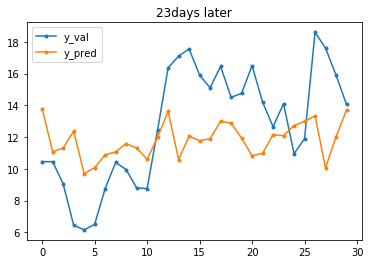

2.9933819384347324
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.22522
[400]	valid_0's l1: 3.2329
[600]	valid_0's l1: 3.2339
[800]	valid_0's l1: 3.23413
Early stopping, best iteration is:
[18]	valid_0's l1: 2.94345


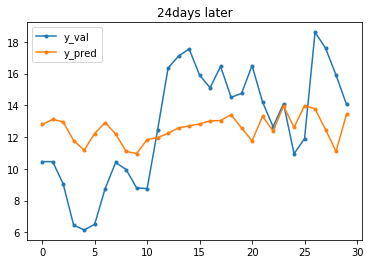

2.943453993163585
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.05169
[400]	valid_0's l1: 3.05883
[600]	valid_0's l1: 3.05921
[800]	valid_0's l1: 3.0593
Early stopping, best iteration is:
[27]	valid_0's l1: 2.88696


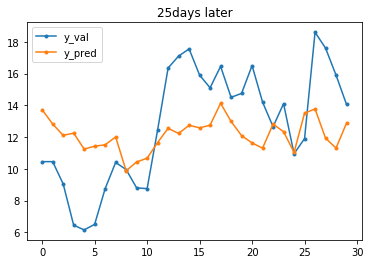

2.8869604951264307
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.85533
[400]	valid_0's l1: 2.85588
[600]	valid_0's l1: 2.85562
[800]	valid_0's l1: 2.85553
Early stopping, best iteration is:
[24]	valid_0's l1: 2.83736


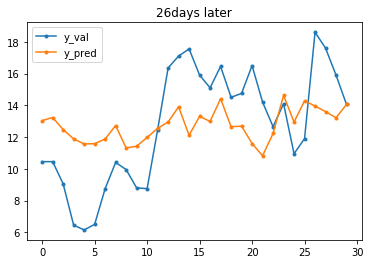

2.837355136346815
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.02739
[400]	valid_0's l1: 3.02343
[600]	valid_0's l1: 3.02339
[800]	valid_0's l1: 3.02191
Early stopping, best iteration is:
[19]	valid_0's l1: 2.88896


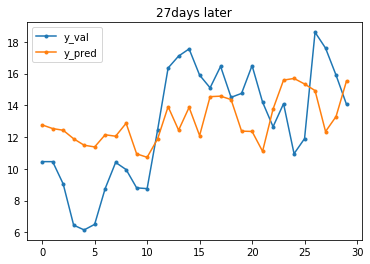

2.888963035862369
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.09748
[400]	valid_0's l1: 3.10429
[600]	valid_0's l1: 3.10479
[800]	valid_0's l1: 3.1042
Early stopping, best iteration is:
[16]	valid_0's l1: 2.88704


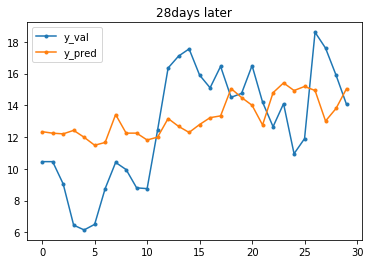

2.8870356466480382
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.95716
[400]	valid_0's l1: 2.96115
[600]	valid_0's l1: 2.96004
[800]	valid_0's l1: 2.95929
Early stopping, best iteration is:
[42]	valid_0's l1: 2.85273


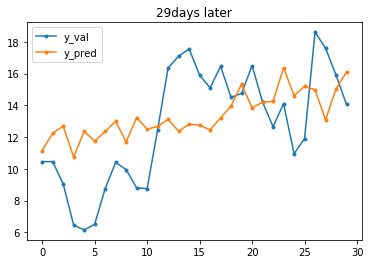

2.852730983109479
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.10038
[400]	valid_0's l1: 3.10046
[600]	valid_0's l1: 3.09949
[800]	valid_0's l1: 3.09835
Early stopping, best iteration is:
[24]	valid_0's l1: 2.90187


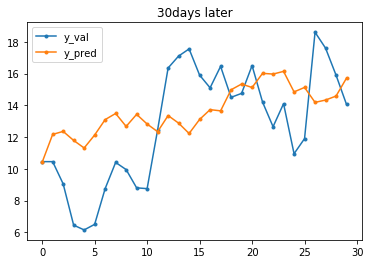

2.9018671007805787
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.98794
[400]	valid_0's l1: 2.9918
[600]	valid_0's l1: 2.99069
[800]	valid_0's l1: 2.99029
Early stopping, best iteration is:
[23]	valid_0's l1: 2.72937


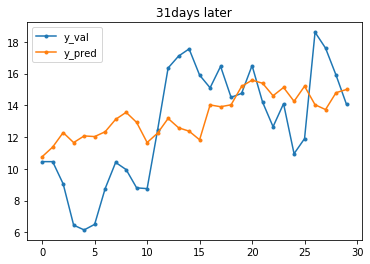

2.7293683214039057
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.07575
[400]	valid_0's l1: 3.07669
[600]	valid_0's l1: 3.073
[800]	valid_0's l1: 3.07006
Early stopping, best iteration is:
[13]	valid_0's l1: 2.84973


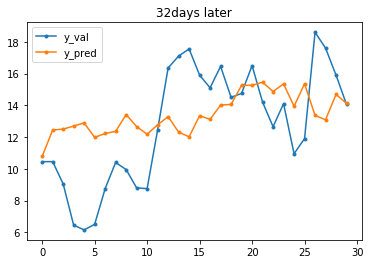

2.8497265342303777
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.87873
[400]	valid_0's l1: 2.87968
[600]	valid_0's l1: 2.88053
[800]	valid_0's l1: 2.87994
Early stopping, best iteration is:
[29]	valid_0's l1: 2.71481


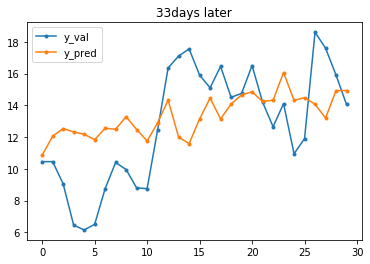

2.714813117838168
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.17654
[400]	valid_0's l1: 3.18436
[600]	valid_0's l1: 3.18179
[800]	valid_0's l1: 3.18125
Early stopping, best iteration is:
[27]	valid_0's l1: 2.87182


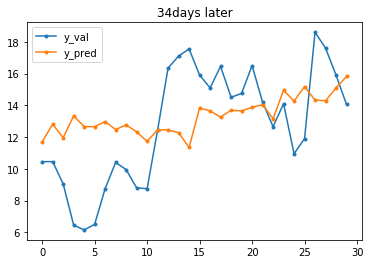

2.871818367960601


In [68]:
y_columns = ['sfctemp_min']
sfctemp_min_models = {}
scores = []

# 7일~34일 후를 예측하는 각각의 모델 구축
for future in range(7, 35):
    train_split = target.shape[0]-past-future-30
    x_train, y_train = trans(target, 0, train_split, past, future, sfctemp_x_columns, y_columns)
    x_val, y_val = trans(target, train_split, None, past, future, sfctemp_x_columns, y_columns)
    
    sfctemp_min_models[future] = create_model(x_train, y_train, x_val, y_val)
    
    pred = sfctemp_min_models[future].predict(x_val)
    
    plt.rcParams['figure.figsize'] = [6, 4]
    plt.plot(np.array(y_val), '.-', label='y_val')
    plt.plot(pred, '.-', label='y_pred')
    plt.title(str(future)+'days later')
    plt.legend()
    plt.show()
    
    score = mean_absolute_error(y_val, pred)
    scores.append(score)
    print(score)
    print('==========================================================================')

In [69]:
print("mean", sum(scores) / len(scores))
print("min", min(scores))
print("max", max(scores))

mean 2.985184255703769
min 2.714813117838168
max 3.163600657457509


## Mean

Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.2071
[400]	valid_0's l1: 2.20533
[600]	valid_0's l1: 2.20493
[800]	valid_0's l1: 2.20471
Early stopping, best iteration is:
[18]	valid_0's l1: 1.92372


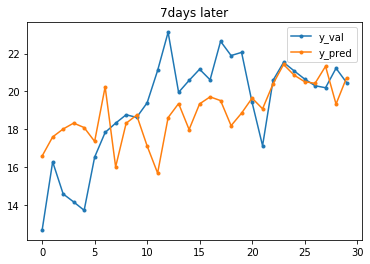

1.923717093551993
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.30991
[400]	valid_0's l1: 2.31017
[600]	valid_0's l1: 2.31057
[800]	valid_0's l1: 2.31048
Early stopping, best iteration is:
[18]	valid_0's l1: 2.05363


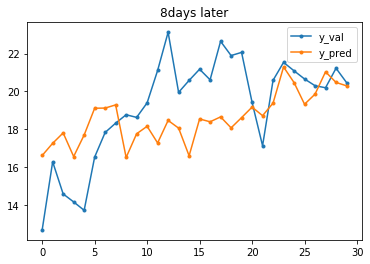

2.053629349513509
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.6296
[400]	valid_0's l1: 2.63544
[600]	valid_0's l1: 2.63655
[800]	valid_0's l1: 2.63736
Early stopping, best iteration is:
[17]	valid_0's l1: 2.33495


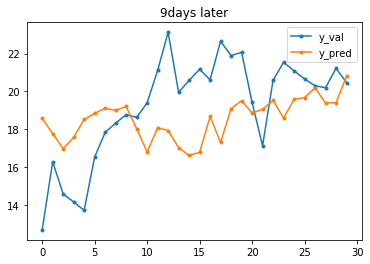

2.3349494955498766
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.46233
[400]	valid_0's l1: 2.46344
[600]	valid_0's l1: 2.46361
[800]	valid_0's l1: 2.46359
Early stopping, best iteration is:
[11]	valid_0's l1: 2.11828


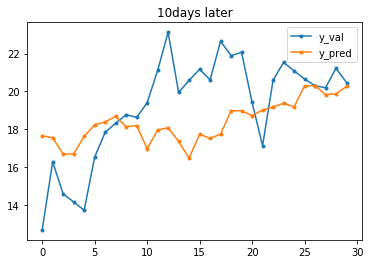

2.118282779825749
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.6334
[400]	valid_0's l1: 2.64052
[600]	valid_0's l1: 2.64073
[800]	valid_0's l1: 2.6409
Early stopping, best iteration is:
[15]	valid_0's l1: 2.25812


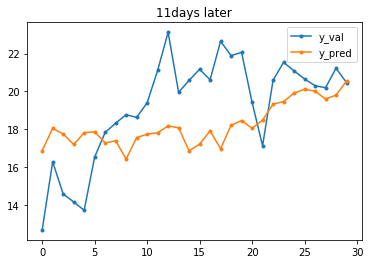

2.2581187026811023
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.84901
[400]	valid_0's l1: 2.84578
[600]	valid_0's l1: 2.84597
[800]	valid_0's l1: 2.8464
Early stopping, best iteration is:
[2]	valid_0's l1: 2.32007


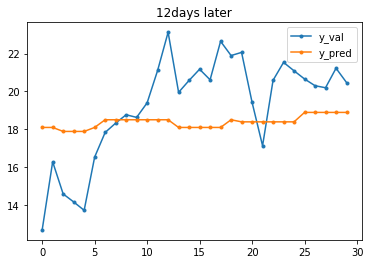

2.3200699652424537
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 3.14475
[400]	valid_0's l1: 3.14335
[600]	valid_0's l1: 3.14346
[800]	valid_0's l1: 3.14363
Early stopping, best iteration is:
[8]	valid_0's l1: 2.35363


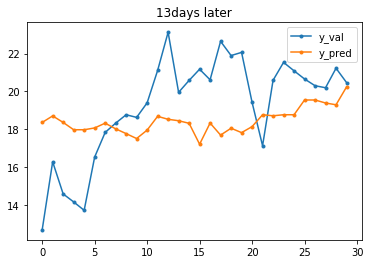

2.3536252677617897
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.71069
[400]	valid_0's l1: 2.71588
[600]	valid_0's l1: 2.71492
[800]	valid_0's l1: 2.7149
Early stopping, best iteration is:
[12]	valid_0's l1: 2.30788


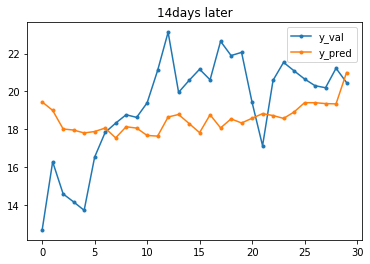

2.307878568190255
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.96723
[400]	valid_0's l1: 2.97686
[600]	valid_0's l1: 2.97857
[800]	valid_0's l1: 2.97874
Early stopping, best iteration is:
[1]	valid_0's l1: 2.54314


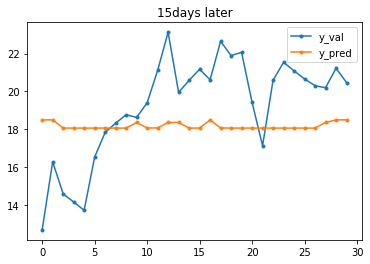

2.543144880947543
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.78926
[400]	valid_0's l1: 2.79091
[600]	valid_0's l1: 2.78997
[800]	valid_0's l1: 2.79021
Early stopping, best iteration is:
[2]	valid_0's l1: 2.49528


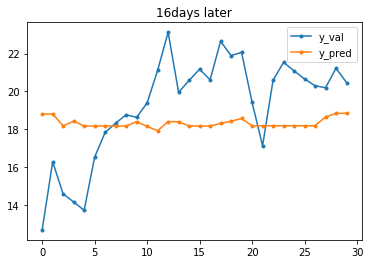

2.495279094474736
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.70645
[400]	valid_0's l1: 2.70966
[600]	valid_0's l1: 2.71011
[800]	valid_0's l1: 2.71017
Early stopping, best iteration is:
[14]	valid_0's l1: 2.26375


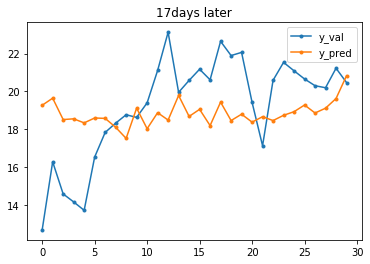

2.2637475491656716
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.44169
[400]	valid_0's l1: 2.45781
[600]	valid_0's l1: 2.47166
[800]	valid_0's l1: 2.47401
Early stopping, best iteration is:
[8]	valid_0's l1: 2.17035


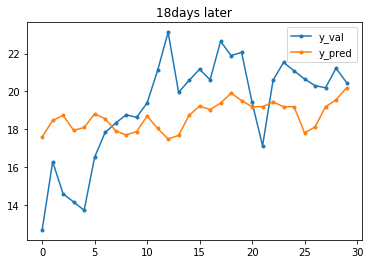

2.170348078682209
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.17794
[400]	valid_0's l1: 2.17689
[600]	valid_0's l1: 2.17558
[800]	valid_0's l1: 2.17539
Early stopping, best iteration is:
[12]	valid_0's l1: 1.86554


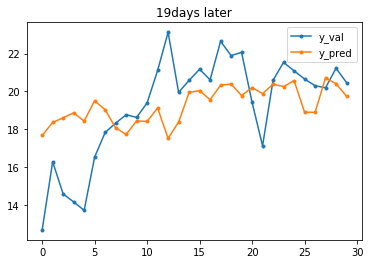

1.8655408983192465
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 1.96003
[400]	valid_0's l1: 1.9667
[600]	valid_0's l1: 1.96715
[800]	valid_0's l1: 1.9671
Early stopping, best iteration is:
[13]	valid_0's l1: 1.8848


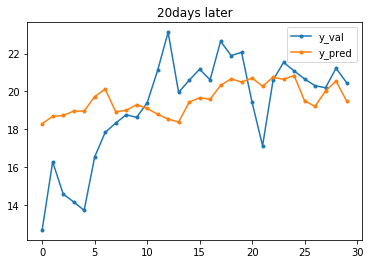

1.8847980139228075
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.24729
[400]	valid_0's l1: 2.24666
[600]	valid_0's l1: 2.24548
[800]	valid_0's l1: 2.24474
Early stopping, best iteration is:
[10]	valid_0's l1: 1.95156


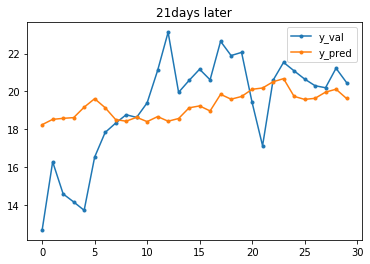

1.9515596367992136
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.40588
[400]	valid_0's l1: 2.40611
[600]	valid_0's l1: 2.40675
[800]	valid_0's l1: 2.4088
Early stopping, best iteration is:
[4]	valid_0's l1: 2.22015


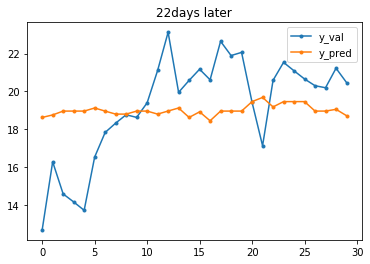

2.2201480767945223
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.09877
[400]	valid_0's l1: 2.10765
[600]	valid_0's l1: 2.10701
[800]	valid_0's l1: 2.10683
Early stopping, best iteration is:
[29]	valid_0's l1: 1.98601


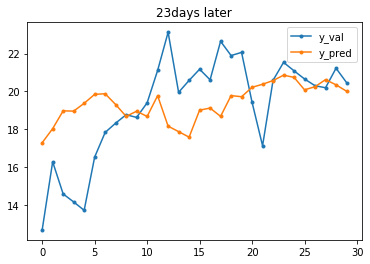

1.9860126211461941
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.05355
[400]	valid_0's l1: 2.06474
[600]	valid_0's l1: 2.06329
[800]	valid_0's l1: 2.06378
Early stopping, best iteration is:
[14]	valid_0's l1: 1.88979


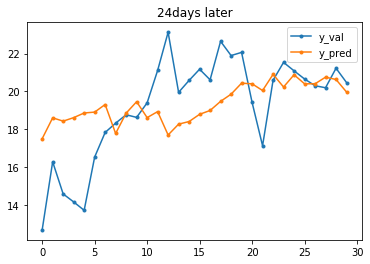

1.8897865302270034
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.05296
[400]	valid_0's l1: 2.05553
[600]	valid_0's l1: 2.05386
[800]	valid_0's l1: 2.05397
Early stopping, best iteration is:
[19]	valid_0's l1: 1.86269


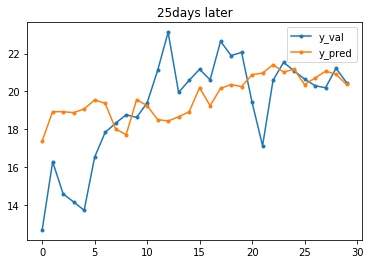

1.8626900340374732
Training until validation scores don't improve for 800 rounds
[200]	valid_0's l1: 2.22824
[400]	valid_0's l1: 2.22554
[600]	valid_0's l1: 2.22542


In [ ]:
y_columns = ['sfctemp_mean']
sfctemp_mean_models = {}
scores = []

# 7일~34일 후를 예측하는 각각의 모델 구축
for future in range(7, 35):
    train_split = target.shape[0]-past-future-30
    x_train, y_train = trans(target, 0, train_split, past, future, sfctemp_x_columns, y_columns)
    x_val, y_val = trans(target, train_split, None, past, future, sfctemp_x_columns, y_columns)
    
    sfctemp_mean_models[future] = create_model(x_train, y_train, x_val, y_val)
    
    pred = sfctemp_mean_models[future].predict(x_val)
    
    plt.rcParams['figure.figsize'] = [6, 4]
    plt.plot(np.array(y_val), '.-', label='y_val')
    plt.plot(pred, '.-', label='y_pred')
    plt.title(str(future)+'days later')
    plt.legend()
    plt.show()
    
    score = mean_absolute_error(y_val, pred)
    scores.append(score)
    print(score)
    print('==========================================================================')

In [ ]:
print("mean", sum(scores) / len(scores))
print("min", min(scores))
print("max", max(scores))

# landP

In [32]:
press_x_columns = ['landP_max', 'landP_min', 'landP_mean', \
                  'seaP_max', 'seaP_min', 'seaP_mean', \
                  'year', 'month', 'day']

In [33]:
def landP_model(x_train, y_train, x_val, y_val):
    params = {
        'metric': 'mae',
        'seed':7777,
        'learning_rate': 0.02
        }
    
    d_train = lgb.Dataset(x_train, y_train)
    d_val = lgb.Dataset(x_val, y_val)

    model = lgb.train(params, d_train, 1200, \
                      d_val, verbose_eval=600, \
                      )
    
    return model

## Max

[600]	valid_0's l1: 4.11274
[1200]	valid_0's l1: 4.09836


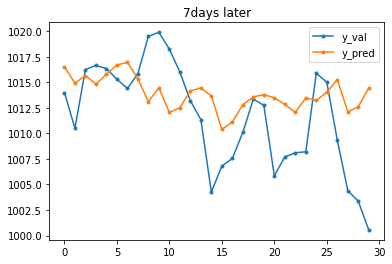

4.098351677654822
[600]	valid_0's l1: 4.12639
[1200]	valid_0's l1: 4.11123


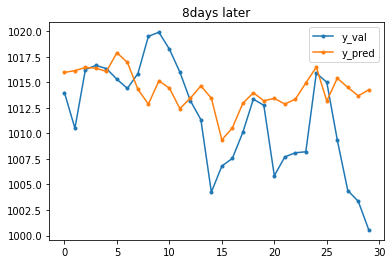

4.111225099198513
[600]	valid_0's l1: 4.26459
[1200]	valid_0's l1: 4.25638


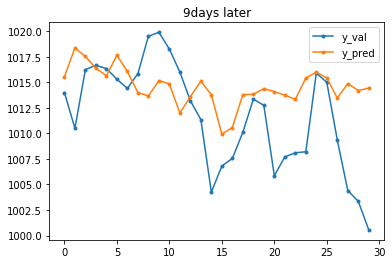

4.256378710565404
[600]	valid_0's l1: 4.19923
[1200]	valid_0's l1: 4.21001


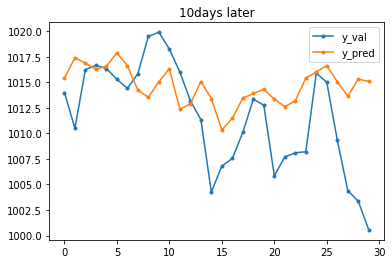

4.210005287566018
[600]	valid_0's l1: 4.13496
[1200]	valid_0's l1: 4.14387


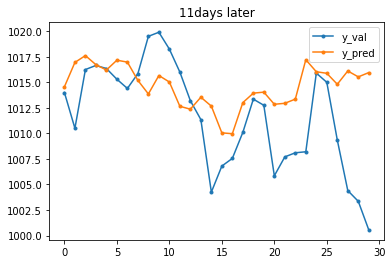

4.1438699800914796
[600]	valid_0's l1: 3.90125
[1200]	valid_0's l1: 3.91093


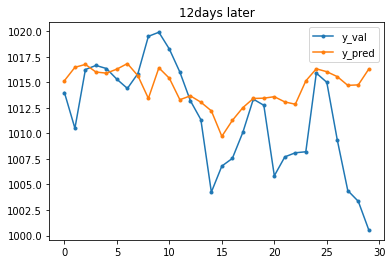

3.9109285605917306
[600]	valid_0's l1: 4.03197
[1200]	valid_0's l1: 4.04667


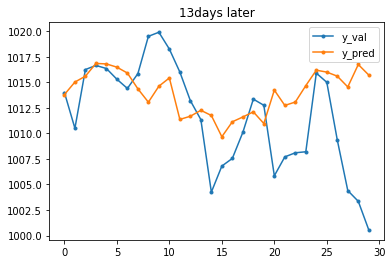

4.046670214404165
[600]	valid_0's l1: 4.3509
[1200]	valid_0's l1: 4.36414


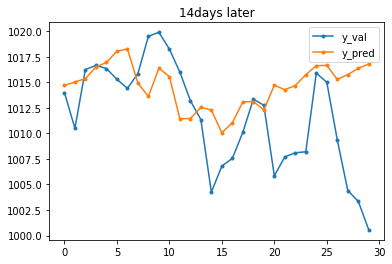

4.364134579688107
[600]	valid_0's l1: 4.2141
[1200]	valid_0's l1: 4.2257


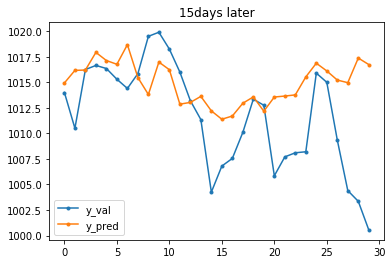

4.2256940895596475
[600]	valid_0's l1: 4.16083
[1200]	valid_0's l1: 4.18251


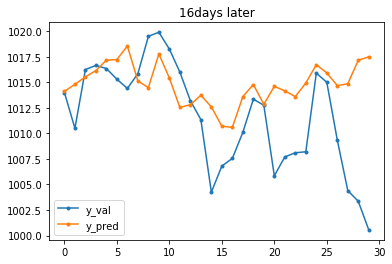

4.182499389093308
[600]	valid_0's l1: 4.10981
[1200]	valid_0's l1: 4.13025


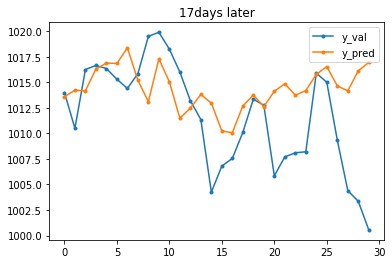

4.1302413906407045
[600]	valid_0's l1: 4.12682
[1200]	valid_0's l1: 4.14255


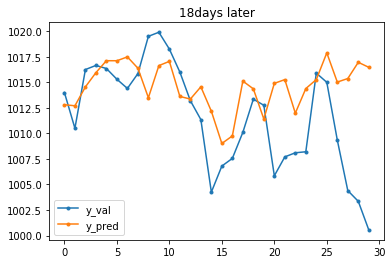

4.142543611943885
[600]	valid_0's l1: 3.80036
[1200]	valid_0's l1: 3.85447


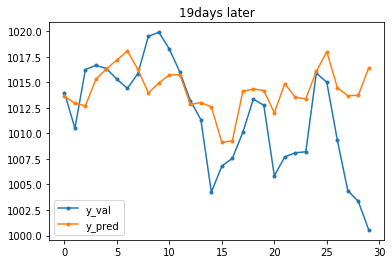

3.8544603580829135
[600]	valid_0's l1: 4.24595
[1200]	valid_0's l1: 4.35217


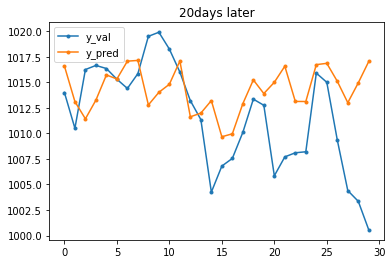

4.352163375719287
[600]	valid_0's l1: 4.07954
[1200]	valid_0's l1: 4.14443


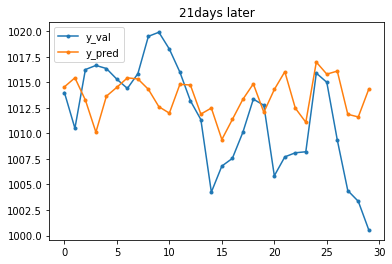

4.144429260043789
[600]	valid_0's l1: 4.27092
[1200]	valid_0's l1: 4.28789


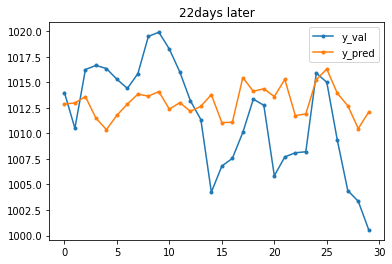

4.2878817231096304
[600]	valid_0's l1: 4.63714
[1200]	valid_0's l1: 4.63807


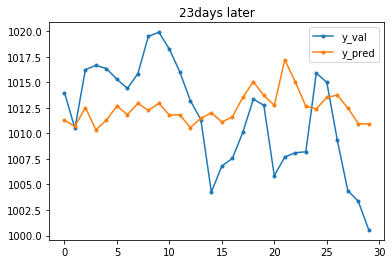

4.638063426956751
[600]	valid_0's l1: 4.67287
[1200]	valid_0's l1: 4.69502


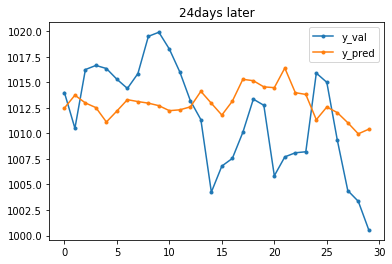

4.695009127748627
[600]	valid_0's l1: 4.33528
[1200]	valid_0's l1: 4.33095


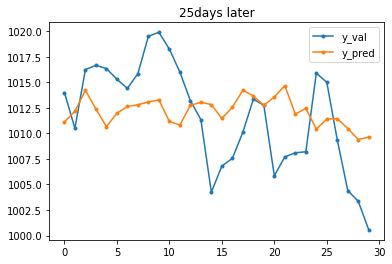

4.330942169091065
[600]	valid_0's l1: 4.07809
[1200]	valid_0's l1: 4.08575


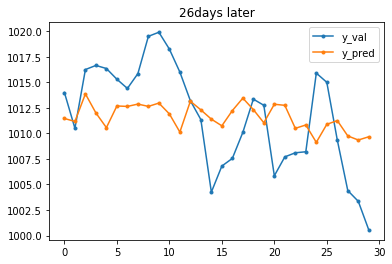

4.085745705115968
[600]	valid_0's l1: 4.13745
[1200]	valid_0's l1: 4.13659


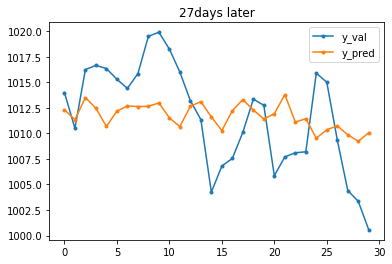

4.136585032528633
[600]	valid_0's l1: 4.13729
[1200]	valid_0's l1: 4.14545


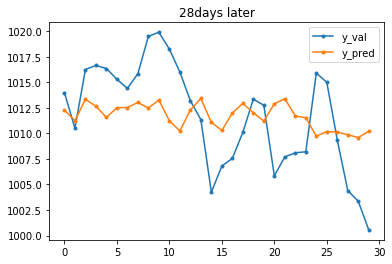

4.145443572590534
[600]	valid_0's l1: 4.01238
[1200]	valid_0's l1: 4.01914


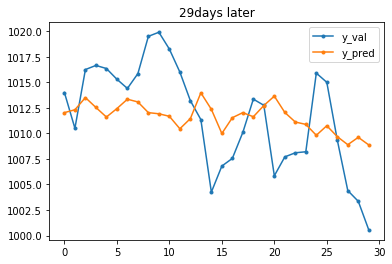

4.019135421990681
[600]	valid_0's l1: 4.00148
[1200]	valid_0's l1: 4.00189


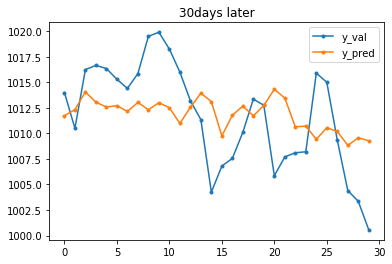

4.001882427351469
[600]	valid_0's l1: 4.04208
[1200]	valid_0's l1: 4.05597


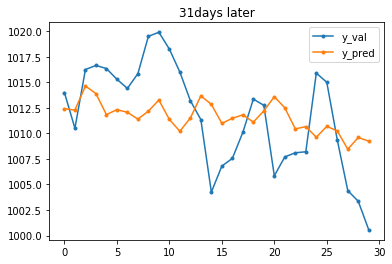

4.055961549825736
[600]	valid_0's l1: 4.14026
[1200]	valid_0's l1: 4.15524


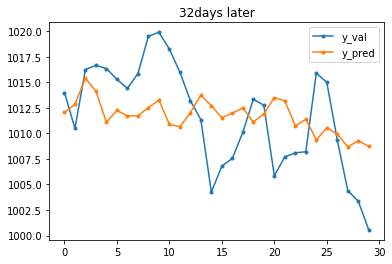

4.155234402457953
[600]	valid_0's l1: 4.10873
[1200]	valid_0's l1: 4.1262


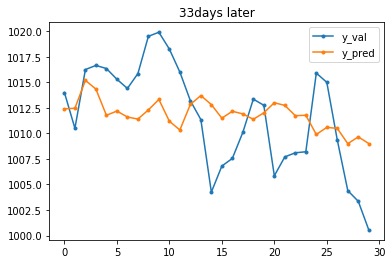

4.126191530507473
[600]	valid_0's l1: 4.01468
[1200]	valid_0's l1: 4.01486


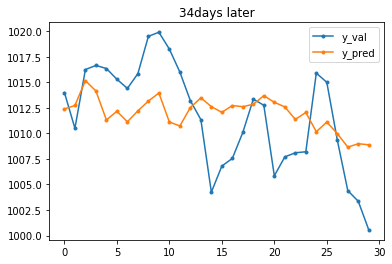

4.01485289876584


In [34]:
y_columns = ['landP_max']
landP_max_models = {}
scores = []

# 7일~34일 후를 예측하는 각각의 모델 구축
for future in range(7, 35):
    train_split = target.shape[0]-past-future-30
    x_train, y_train = trans(target, 0, train_split, past, future, press_x_columns, y_columns)
    x_val, y_val = trans(target, train_split, None, past, future, press_x_columns, y_columns)
    
    landP_max_models[future] = landP_model(x_train, y_train, x_val, y_val)
    
    pred = landP_max_models[future].predict(x_val)
    
    plt.rcParams['figure.figsize'] = [6, 4]
    plt.plot(np.array(y_val), '.-', label='y_val')
    plt.plot(pred, '.-', label='y_pred')
    plt.title(str(future)+'days later')
    plt.legend()
    plt.show()
    
    score = mean_absolute_error(y_val, pred)
    scores.append(score)
    print(score)
    print('==========================================================================')

In [35]:
print("mean", sum(scores) / len(scores))
print("min", min(scores))
print("max", max(scores))

mean 4.173804449031576
min 3.8544603580829135
max 4.695009127748627


In [ ]:
y_columns = ['landP_max']
scores = []

# 7일~34일 후를 예측하는 각각의 모델 구축
for future in range(7, 35):
    train_split = target.shape[0]-past-future-30
    x_train, y_train = trans(target, 0, train_split, past, future, press_x_columns, y_columns)
    x_val, y_val = trans(target, train_split, None, past, future, press_x_columns, y_columns)
    
    model = landP_model(x_train, y_train, x_val, y_val)
    pred = model.predict(x_val)
    
    plt.rcParams['figure.figsize'] = [6, 4]
    plt.plot(np.array(y_val), '.-', label='y_val')
    plt.plot(pred, '.-', label='y_pred')
    plt.title(str(future)+'days later')
    plt.legend()
    plt.show()
    
    score = mean_absolute_error(y_val, pred)
    scores.append(score)
    print('==========================================================================')

In [ ]:
print("mean", sum(scores) / len(scores))
print("min", min(scores))
print("max", max(scores))

## Min

[600]	valid_0's l1: 4.78372
[1200]	valid_0's l1: 4.77185


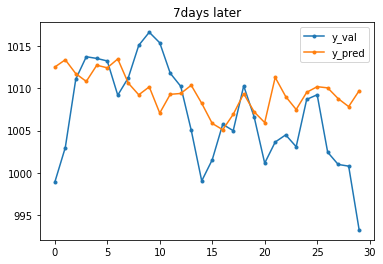

4.771848986165916
[600]	valid_0's l1: 4.97686
[1200]	valid_0's l1: 4.97836


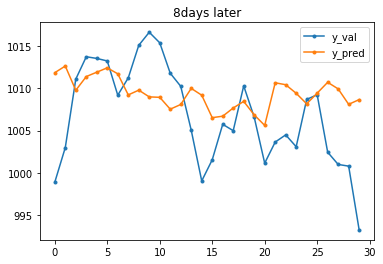

4.9783655722486095
[600]	valid_0's l1: 4.80141
[1200]	valid_0's l1: 4.7691


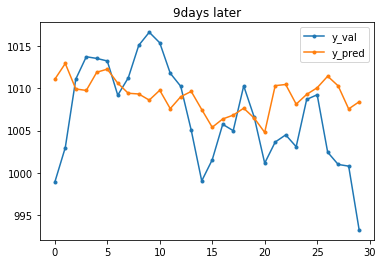

4.769100263436368
[600]	valid_0's l1: 4.94144
[1200]	valid_0's l1: 4.9231


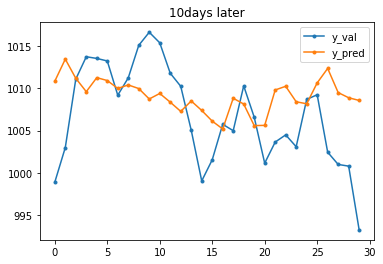

4.923096774462783
[600]	valid_0's l1: 4.89371
[1200]	valid_0's l1: 4.90072


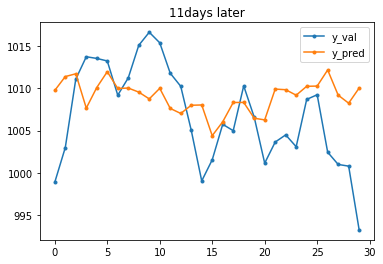

4.900719017489837
[600]	valid_0's l1: 4.66561
[1200]	valid_0's l1: 4.65876


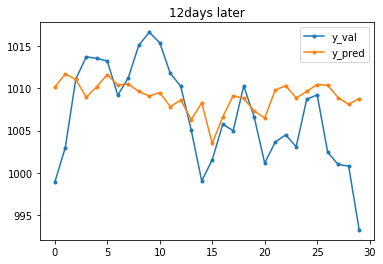

4.658756883503266
[600]	valid_0's l1: 4.6128
[1200]	valid_0's l1: 4.6036


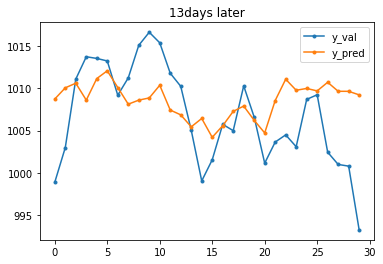

4.6036016446237
[600]	valid_0's l1: 5.0297
[1200]	valid_0's l1: 5.02786


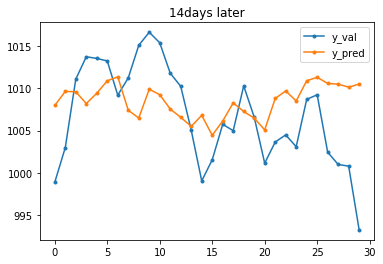

5.027863856739517
[600]	valid_0's l1: 4.91696
[1200]	valid_0's l1: 4.92899


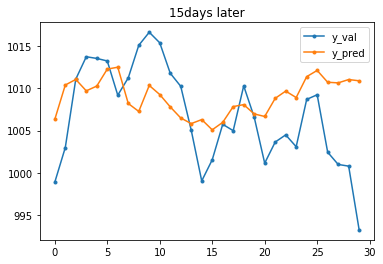

4.9289873061350855
[600]	valid_0's l1: 5.0818
[1200]	valid_0's l1: 5.09034


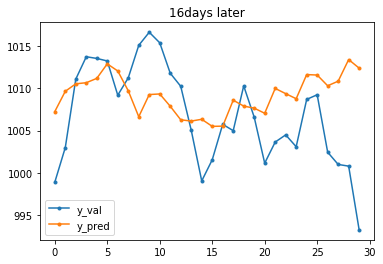

5.090338904452968
[600]	valid_0's l1: 5.16726
[1200]	valid_0's l1: 5.1859


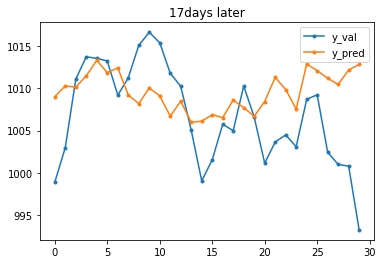

5.185906302323955
[600]	valid_0's l1: 5.48528
[1200]	valid_0's l1: 5.4656


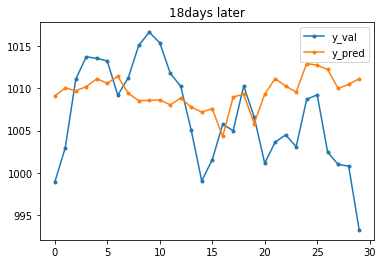

5.465603781507457
[600]	valid_0's l1: 5.37879
[1200]	valid_0's l1: 5.40005


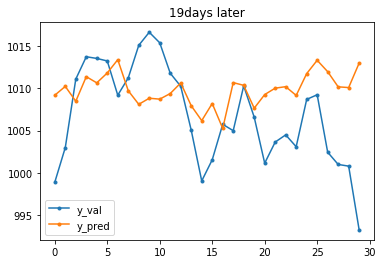

5.400048565098553
[600]	valid_0's l1: 5.06158
[1200]	valid_0's l1: 5.0654


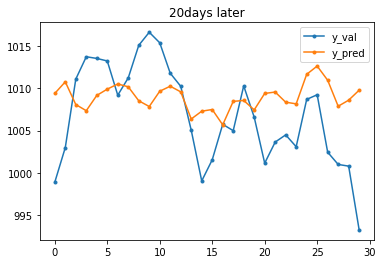

5.065403812136022
[600]	valid_0's l1: 4.96341
[1200]	valid_0's l1: 5.00087


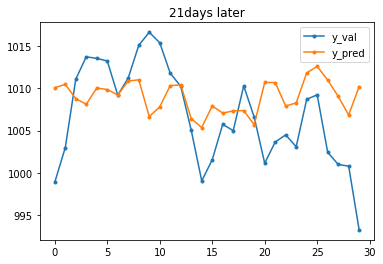

5.000873471093155
[600]	valid_0's l1: 5.12803
[1200]	valid_0's l1: 5.16245


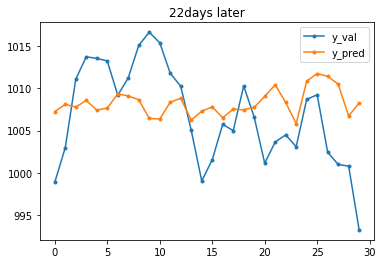

5.162454436622462
[600]	valid_0's l1: 5.01771
[1200]	valid_0's l1: 5.03258


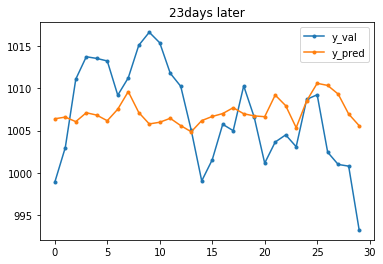

5.0325792296288645
[600]	valid_0's l1: 4.88775
[1200]	valid_0's l1: 4.89497


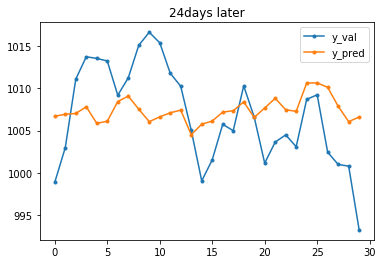

4.8949689741034454
[600]	valid_0's l1: 5.06734
[1200]	valid_0's l1: 5.08018


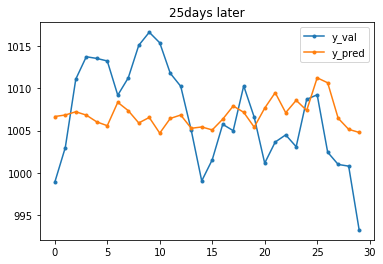

5.080178664026744
[600]	valid_0's l1: 5.00758
[1200]	valid_0's l1: 5.02079


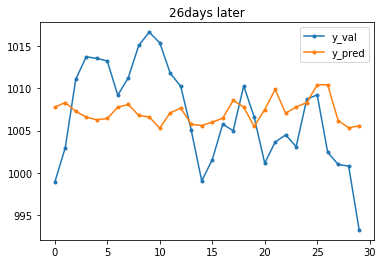

5.020796539078413
[600]	valid_0's l1: 5.12006
[1200]	valid_0's l1: 5.13746


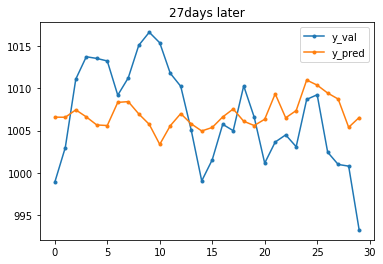

5.137460101374203
[600]	valid_0's l1: 5.0766
[1200]	valid_0's l1: 5.06432


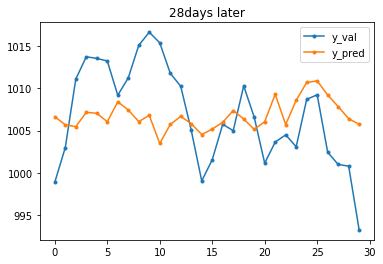

5.064325762435294
[600]	valid_0's l1: 4.69912
[1200]	valid_0's l1: 4.68797


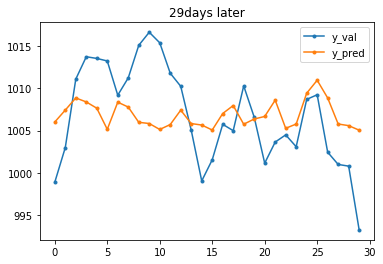

4.68797641301685
[600]	valid_0's l1: 4.86468
[1200]	valid_0's l1: 4.86301


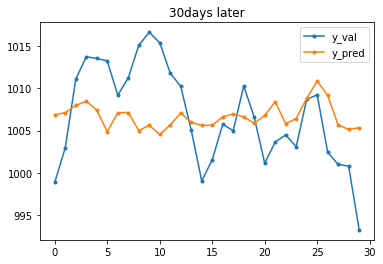

4.8630128936362285
[600]	valid_0's l1: 4.72633
[1200]	valid_0's l1: 4.7191


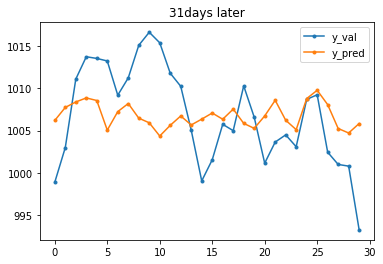

4.719100430521879
[600]	valid_0's l1: 4.84719
[1200]	valid_0's l1: 4.84119


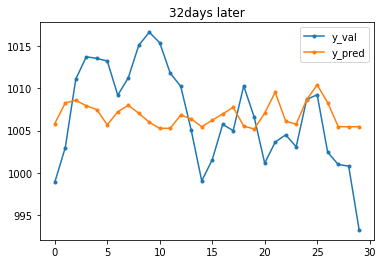

4.841192872816157
[600]	valid_0's l1: 4.92545
[1200]	valid_0's l1: 4.92598


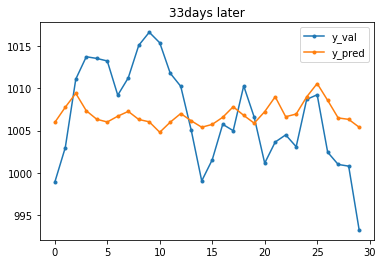

4.925979157207382
[600]	valid_0's l1: 4.60373
[1200]	valid_0's l1: 4.59098


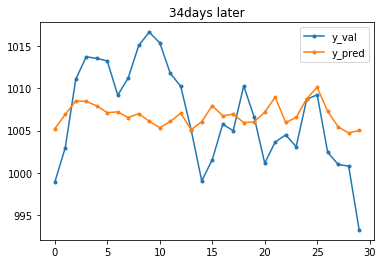

4.5909814495176455


In [45]:
y_columns = ['landP_min']
landP_min_models = {}
scores = []

# 7일~34일 후를 예측하는 각각의 모델 구축
for future in range(7, 35):
    train_split = target.shape[0]-past-future-30
    x_train, y_train = trans(target, 0, train_split, past, future, press_x_columns, y_columns)
    x_val, y_val = trans(target, train_split, None, past, future, press_x_columns, y_columns)
    
    landP_min_models[future] = landP_model(x_train, y_train, x_val, y_val)
    
    pred = landP_min_models[future].predict(x_val)
    
    plt.rcParams['figure.figsize'] = [6, 4]
    plt.plot(np.array(y_val), '.-', label='y_val')
    plt.plot(pred, '.-', label='y_pred')
    plt.title(str(future)+'days later')
    plt.legend()
    plt.show()
    
    score = mean_absolute_error(y_val, pred)
    scores.append(score)
    print(score)
    print('==========================================================================')

In [46]:
print("mean", sum(scores) / len(scores))
print("min", min(scores))
print("max", max(scores))

mean 4.9568400737643845
min 4.5909814495176455
max 5.465603781507457


## Mean

[600]	valid_0's l1: 4.55794
[1200]	valid_0's l1: 4.56287


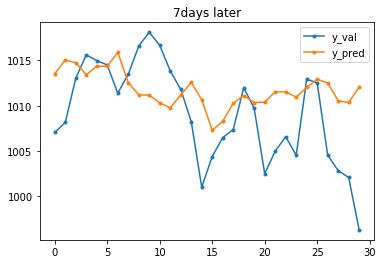

4.562864831236216
[600]	valid_0's l1: 4.58871
[1200]	valid_0's l1: 4.58646


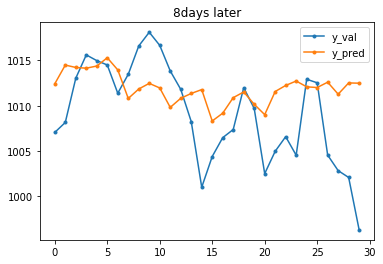

4.586456462249161
[600]	valid_0's l1: 4.92664
[1200]	valid_0's l1: 4.89392


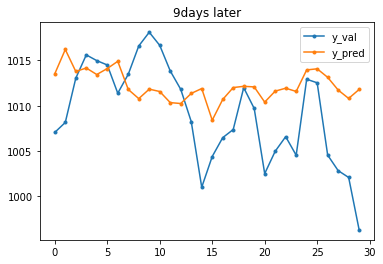

4.893918139792735
[600]	valid_0's l1: 4.75817
[1200]	valid_0's l1: 4.7431


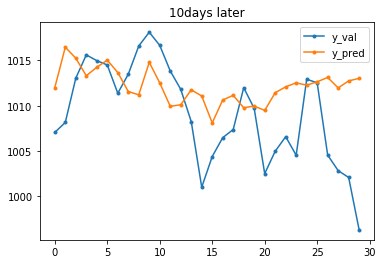

4.743099051415803
[600]	valid_0's l1: 4.63087
[1200]	valid_0's l1: 4.63663


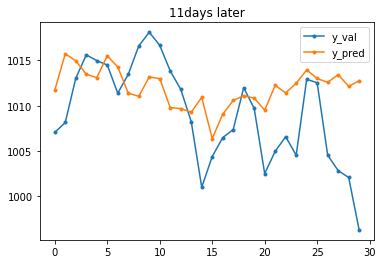

4.636630418317051
[600]	valid_0's l1: 4.60745
[1200]	valid_0's l1: 4.60979


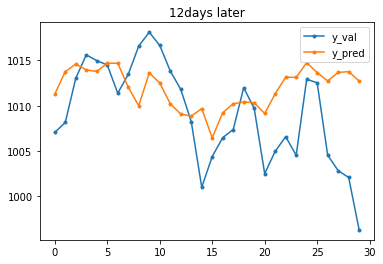

4.609786338872565
[600]	valid_0's l1: 4.45581
[1200]	valid_0's l1: 4.45476


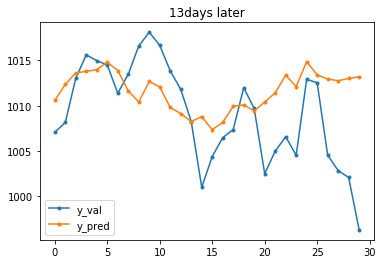

4.454757825483614
[600]	valid_0's l1: 4.44253
[1200]	valid_0's l1: 4.4338


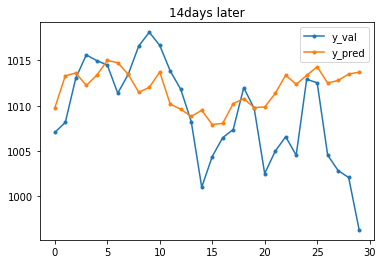

4.433805562596077
[600]	valid_0's l1: 4.40376
[1200]	valid_0's l1: 4.41262


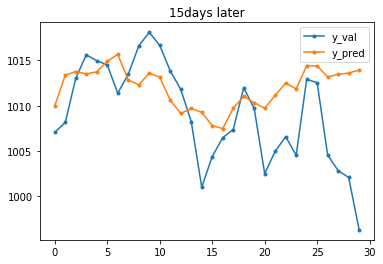

4.41261667286927
[600]	valid_0's l1: 4.54736
[1200]	valid_0's l1: 4.55646


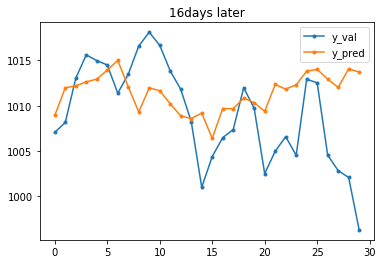

4.556463399238085
[600]	valid_0's l1: 4.56344
[1200]	valid_0's l1: 4.56291


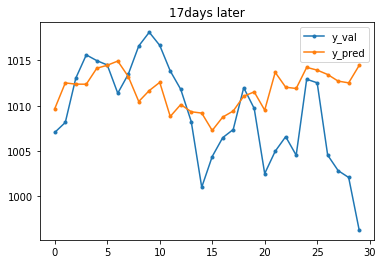

4.5629109043384535
[600]	valid_0's l1: 4.75079
[1200]	valid_0's l1: 4.75603


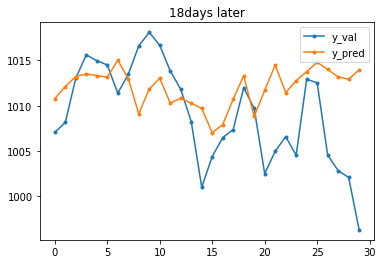

4.756035261601937
[600]	valid_0's l1: 4.40683
[1200]	valid_0's l1: 4.41062


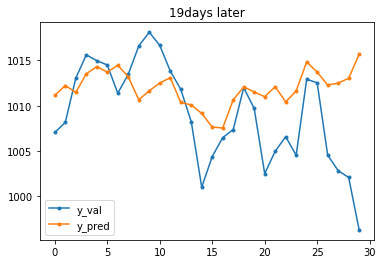

4.4106255358657185
[600]	valid_0's l1: 4.77214
[1200]	valid_0's l1: 4.79693


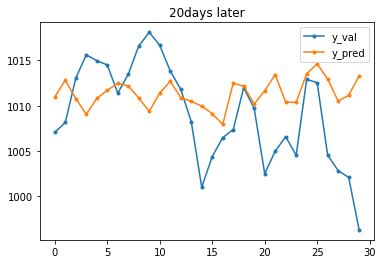

4.796932001044346
[600]	valid_0's l1: 4.62014
[1200]	valid_0's l1: 4.67149


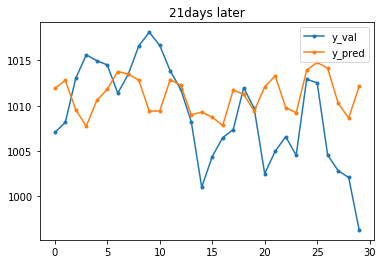

4.671492077655652
[600]	valid_0's l1: 4.71943
[1200]	valid_0's l1: 4.74014


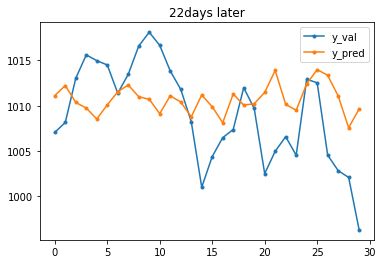

4.740140979198615
[600]	valid_0's l1: 4.57899
[1200]	valid_0's l1: 4.57142


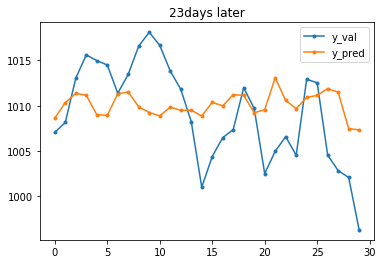

4.571416713297887
[600]	valid_0's l1: 4.84095
[1200]	valid_0's l1: 4.8579


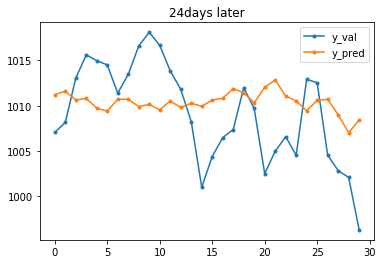

4.857901866430208
[600]	valid_0's l1: 4.76397
[1200]	valid_0's l1: 4.76422


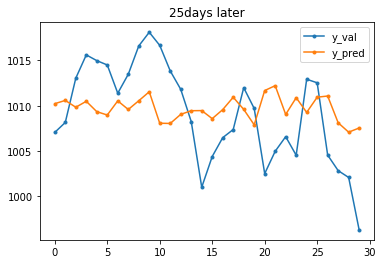

4.764225536778413
[600]	valid_0's l1: 4.69552
[1200]	valid_0's l1: 4.70222


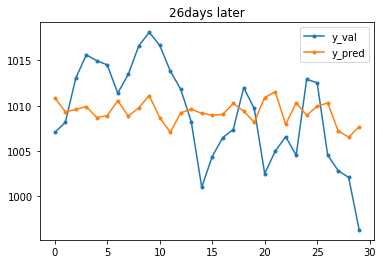

4.702221141108354
[600]	valid_0's l1: 4.68513
[1200]	valid_0's l1: 4.68273


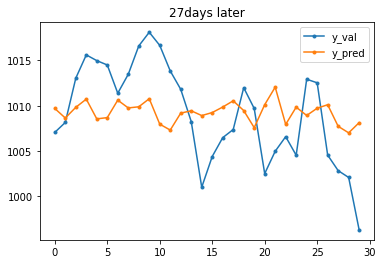

4.6827338400959695
[600]	valid_0's l1: 4.57599
[1200]	valid_0's l1: 4.57507


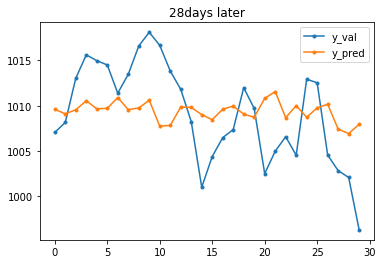

4.575074696110786
[600]	valid_0's l1: 4.42304
[1200]	valid_0's l1: 4.41611


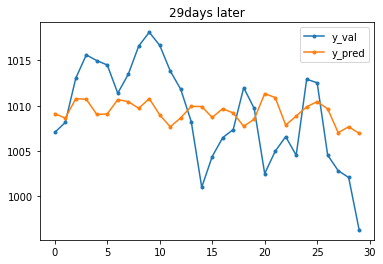

4.416108395929992
[600]	valid_0's l1: 4.39745
[1200]	valid_0's l1: 4.38599


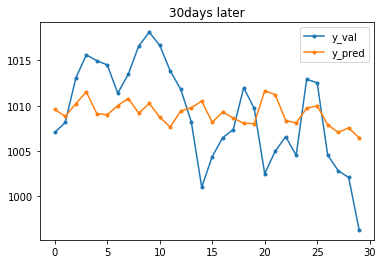

4.38598828021837
[600]	valid_0's l1: 4.65065
[1200]	valid_0's l1: 4.64889


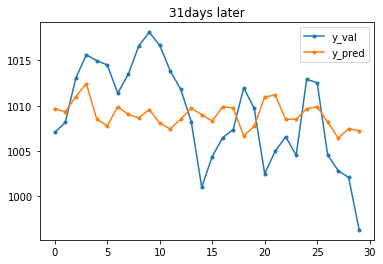

4.648893932613684
[600]	valid_0's l1: 4.61371
[1200]	valid_0's l1: 4.60145


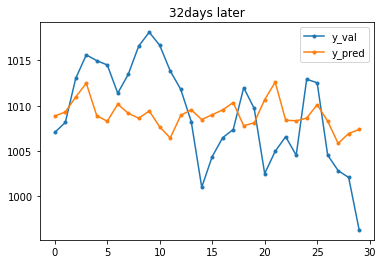

4.601453959636861
[600]	valid_0's l1: 4.45238
[1200]	valid_0's l1: 4.45443


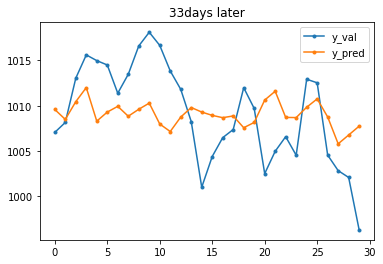

4.454428033128632
[600]	valid_0's l1: 4.47087
[1200]	valid_0's l1: 4.46489


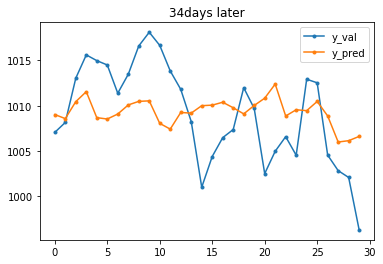

4.464884743045355


In [48]:
y_columns = ['landP_mean']
landP_mean_models = {}
scores = []

# 7일~34일 후를 예측하는 각각의 모델 구축
for future in range(7, 35):
    train_split = target.shape[0]-past-future-30
    x_train, y_train = trans(target, 0, train_split, past, future, press_x_columns, y_columns)
    x_val, y_val = trans(target, train_split, None, past, future, press_x_columns, y_columns)
    
    landP_mean_models[future] = landP_model(x_train, y_train, x_val, y_val)
    
    pred = landP_mean_models[future].predict(x_val)
    
    plt.rcParams['figure.figsize'] = [6, 4]
    plt.plot(np.array(y_val), '.-', label='y_val')
    plt.plot(pred, '.-', label='y_pred')
    plt.title(str(future)+'days later')
    plt.legend()
    plt.show()
    
    score = mean_absolute_error(y_val, pred)
    scores.append(score)
    print(score)
    print('==========================================================================')

In [49]:
print("mean", sum(scores) / len(scores))
print("min", min(scores))
print("max", max(scores))

mean 4.60549523572035
min 4.38598828021837
max 4.893918139792735


# seaP

In [50]:
def seaP_model(x_train, y_train, x_val, y_val):
    params = {
        'metric': 'mae',
        'seed':7777,
        'learning_rate': 0.02
        }
    
    d_train = lgb.Dataset(x_train, y_train)
    d_val = lgb.Dataset(x_val, y_val)

    model = lgb.train(params, d_train, 1200, \
                      d_val, verbose_eval=600, \
                      )
    
    return model

## Max

[600]	valid_0's l1: 4.11274
[1200]	valid_0's l1: 4.09836


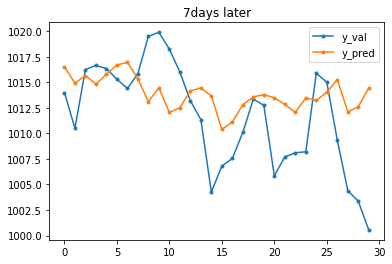

4.098351677654822
[600]	valid_0's l1: 4.12639
[1200]	valid_0's l1: 4.11123


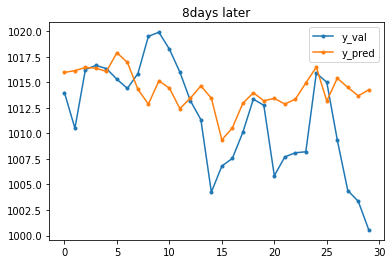

4.111225099198513
[600]	valid_0's l1: 4.26459
[1200]	valid_0's l1: 4.25638


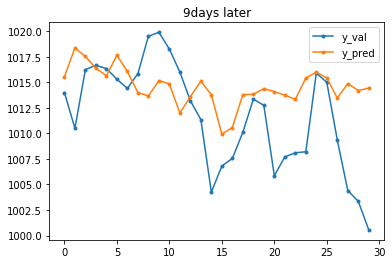

4.256378710565404
[600]	valid_0's l1: 4.19923
[1200]	valid_0's l1: 4.21001


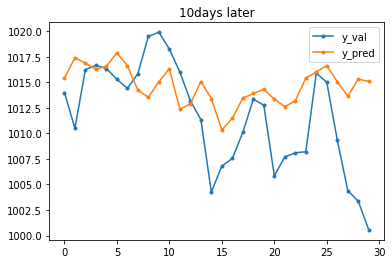

4.210005287566018
[600]	valid_0's l1: 4.13496
[1200]	valid_0's l1: 4.14387


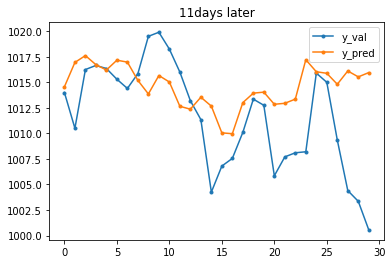

4.1438699800914796
[600]	valid_0's l1: 3.90125
[1200]	valid_0's l1: 3.91093


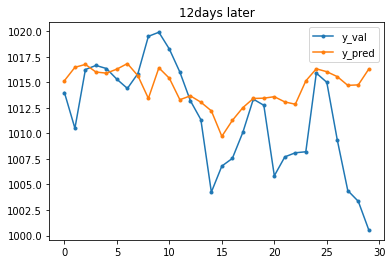

3.9109285605917306
[600]	valid_0's l1: 4.03197
[1200]	valid_0's l1: 4.04667


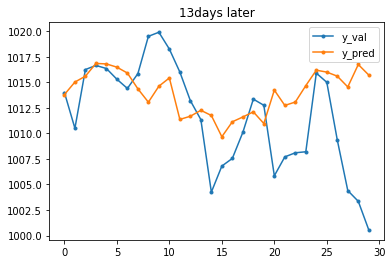

4.046670214404165
[600]	valid_0's l1: 4.3509
[1200]	valid_0's l1: 4.36414


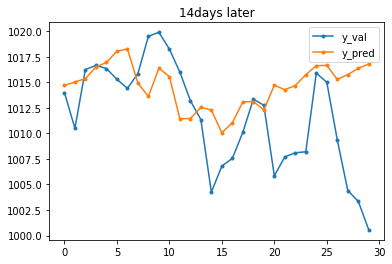

4.364134579688107
[600]	valid_0's l1: 4.2141
[1200]	valid_0's l1: 4.2257


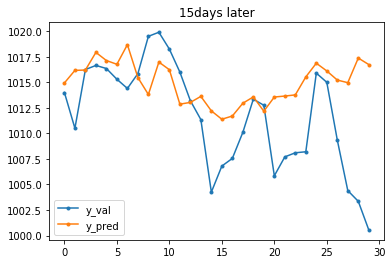

4.2256940895596475
[600]	valid_0's l1: 4.16083
[1200]	valid_0's l1: 4.18251


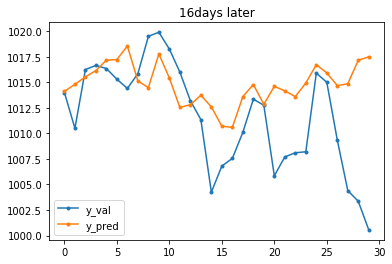

4.182499389093308
[600]	valid_0's l1: 4.10981
[1200]	valid_0's l1: 4.13025


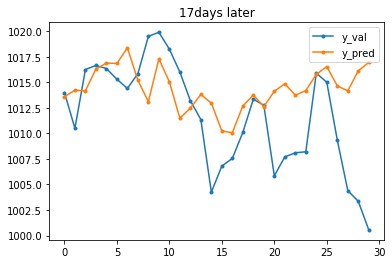

4.1302413906407045
[600]	valid_0's l1: 4.12682
[1200]	valid_0's l1: 4.14255


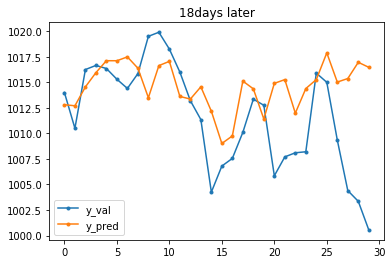

4.142543611943885
[600]	valid_0's l1: 3.80036
[1200]	valid_0's l1: 3.85447


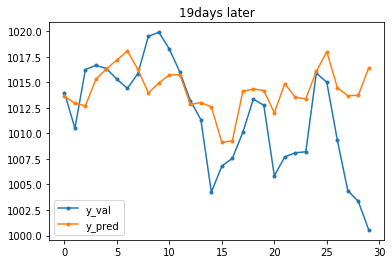

3.8544603580829135
[600]	valid_0's l1: 4.24595
[1200]	valid_0's l1: 4.35217


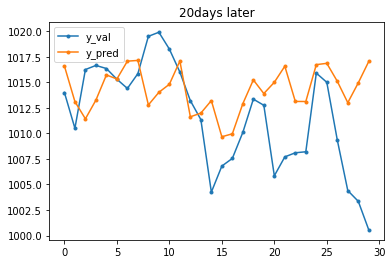

4.352163375719287
[600]	valid_0's l1: 4.07954
[1200]	valid_0's l1: 4.14443


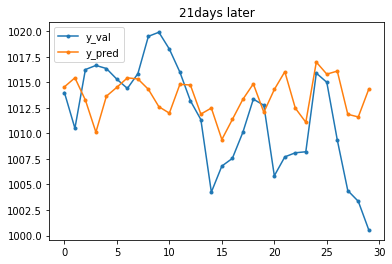

4.144429260043789
[600]	valid_0's l1: 4.27092
[1200]	valid_0's l1: 4.28789


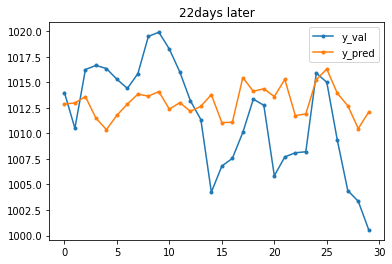

4.2878817231096304
[600]	valid_0's l1: 4.63714
[1200]	valid_0's l1: 4.63807


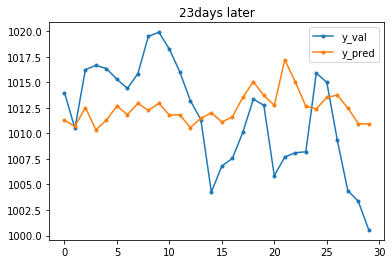

4.638063426956751
[600]	valid_0's l1: 4.67287
[1200]	valid_0's l1: 4.69502


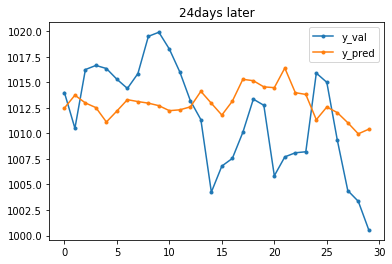

4.695009127748627
[600]	valid_0's l1: 4.33528
[1200]	valid_0's l1: 4.33095


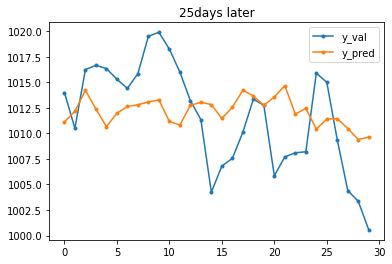

4.330942169091065
[600]	valid_0's l1: 4.07809
[1200]	valid_0's l1: 4.08575


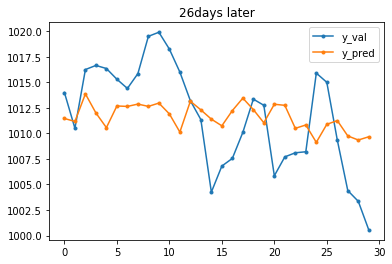

4.085745705115968
[600]	valid_0's l1: 4.13745
[1200]	valid_0's l1: 4.13659


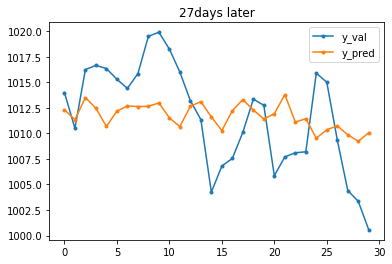

4.136585032528633
[600]	valid_0's l1: 4.13729
[1200]	valid_0's l1: 4.14545


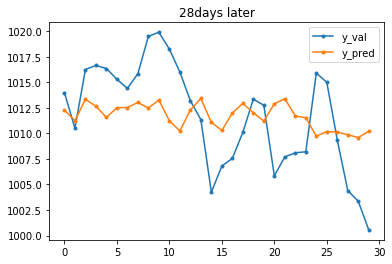

4.145443572590534
[600]	valid_0's l1: 4.01238
[1200]	valid_0's l1: 4.01914


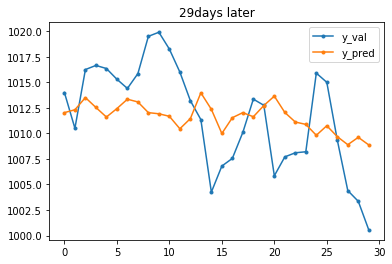

4.019135421990681
[600]	valid_0's l1: 4.00148
[1200]	valid_0's l1: 4.00189


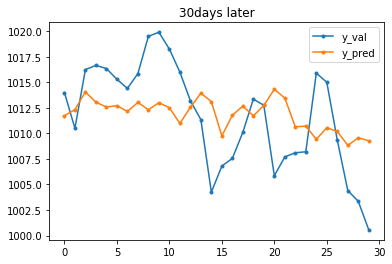

4.001882427351469
[600]	valid_0's l1: 4.04208
[1200]	valid_0's l1: 4.05597


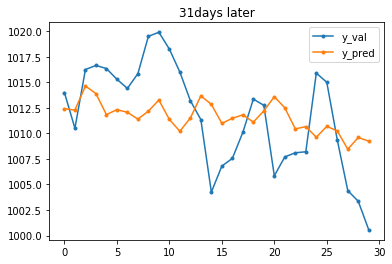

4.055961549825736
[600]	valid_0's l1: 4.14026
[1200]	valid_0's l1: 4.15524


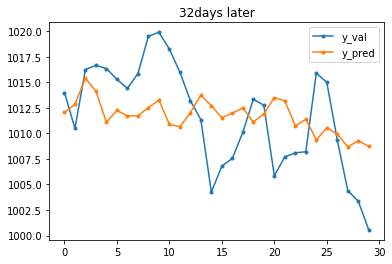

4.155234402457953
[600]	valid_0's l1: 4.10873
[1200]	valid_0's l1: 4.1262


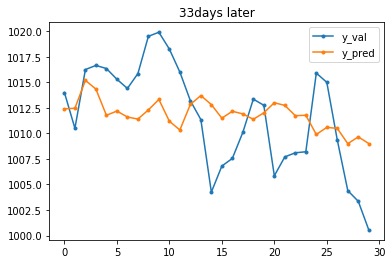

4.126191530507473
[600]	valid_0's l1: 4.01468
[1200]	valid_0's l1: 4.01486


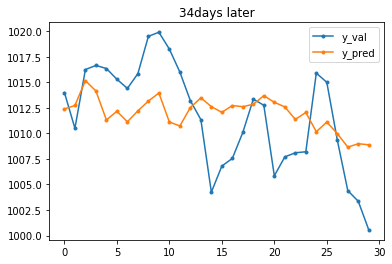

4.01485289876584


In [51]:
y_columns = ['landP_max']
seaP_max_models = {}
scores = []

# 7일~34일 후를 예측하는 각각의 모델 구축
for future in range(7, 35):
    train_split = target.shape[0]-past-future-30
    x_train, y_train = trans(target, 0, train_split, past, future, press_x_columns, y_columns)
    x_val, y_val = trans(target, train_split, None, past, future, press_x_columns, y_columns)
    
    seaP_max_models[future] = seaP_model(x_train, y_train, x_val, y_val)
    
    pred = seaP_max_models[future].predict(x_val)
    
    plt.rcParams['figure.figsize'] = [6, 4]
    plt.plot(np.array(y_val), '.-', label='y_val')
    plt.plot(pred, '.-', label='y_pred')
    plt.title(str(future)+'days later')
    plt.legend()
    plt.show()
    
    score = mean_absolute_error(y_val, pred)
    scores.append(score)
    print(score)
    print('==========================================================================')

In [52]:
print("mean", sum(scores) / len(scores))
print("min", min(scores))
print("max", max(scores))

mean 4.173804449031576
min 3.8544603580829135
max 4.695009127748627


## Min

[600]	valid_0's l1: 4.78372
[1200]	valid_0's l1: 4.77185


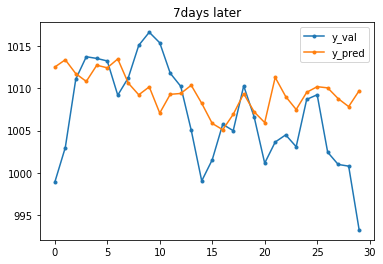

4.771848986165916
[600]	valid_0's l1: 4.97686
[1200]	valid_0's l1: 4.97836


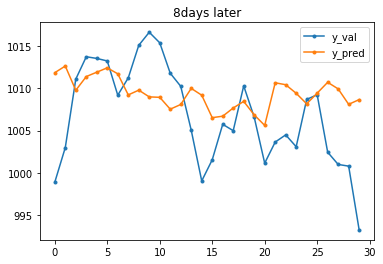

4.9783655722486095
[600]	valid_0's l1: 4.80141
[1200]	valid_0's l1: 4.7691


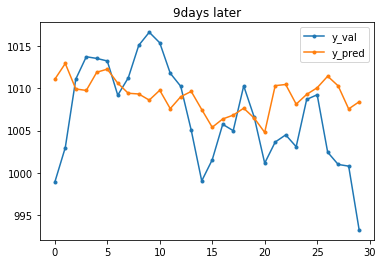

4.769100263436368
[600]	valid_0's l1: 4.94144
[1200]	valid_0's l1: 4.9231


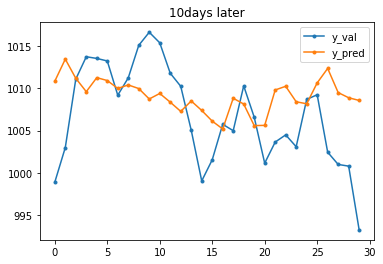

4.923096774462783
[600]	valid_0's l1: 4.89371
[1200]	valid_0's l1: 4.90072


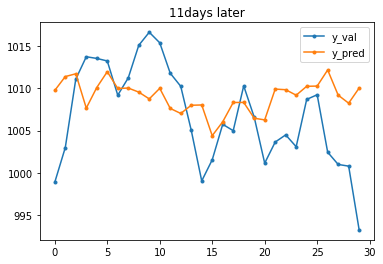

4.900719017489837
[600]	valid_0's l1: 4.66561
[1200]	valid_0's l1: 4.65876


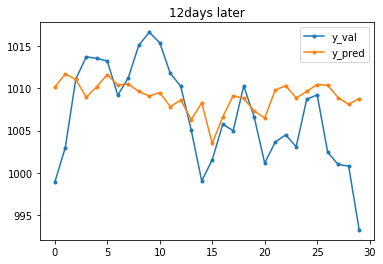

4.658756883503266
[600]	valid_0's l1: 4.6128
[1200]	valid_0's l1: 4.6036


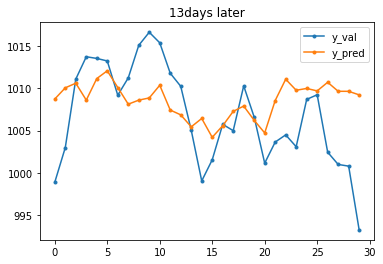

4.6036016446237
[600]	valid_0's l1: 5.0297
[1200]	valid_0's l1: 5.02786


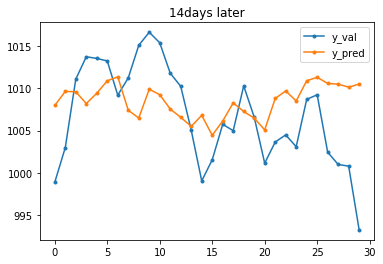

5.027863856739517
[600]	valid_0's l1: 4.91696
[1200]	valid_0's l1: 4.92899


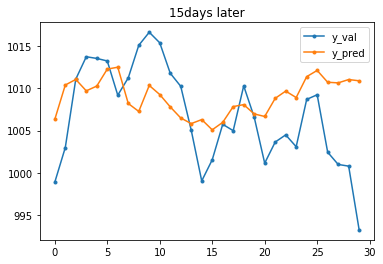

4.9289873061350855
[600]	valid_0's l1: 5.0818
[1200]	valid_0's l1: 5.09034


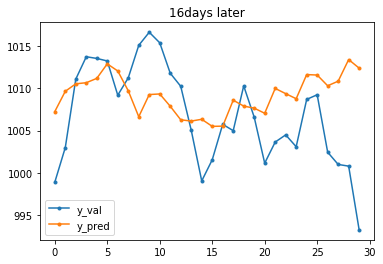

5.090338904452968
[600]	valid_0's l1: 5.16726
[1200]	valid_0's l1: 5.1859


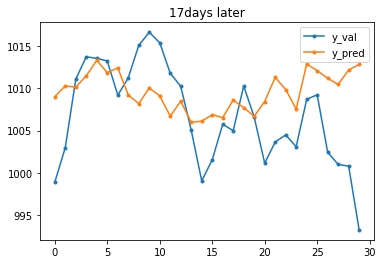

5.185906302323955
[600]	valid_0's l1: 5.48528
[1200]	valid_0's l1: 5.4656


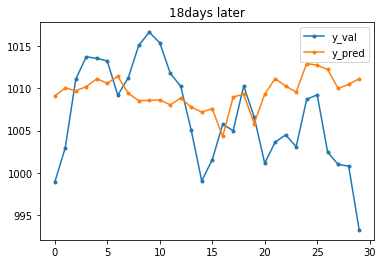

5.465603781507457
[600]	valid_0's l1: 5.37879
[1200]	valid_0's l1: 5.40005


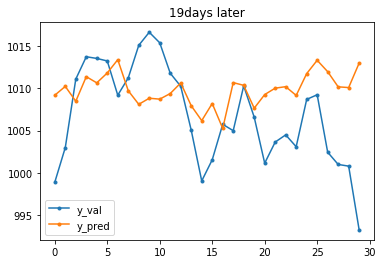

5.400048565098553
[600]	valid_0's l1: 5.06158
[1200]	valid_0's l1: 5.0654


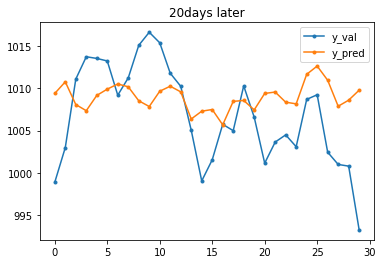

5.065403812136022
[600]	valid_0's l1: 4.96341
[1200]	valid_0's l1: 5.00087


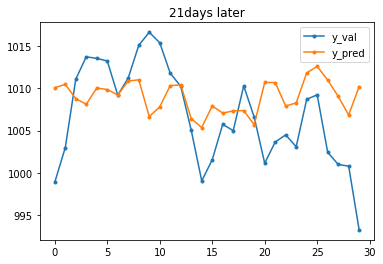

5.000873471093155
[600]	valid_0's l1: 5.12803
[1200]	valid_0's l1: 5.16245


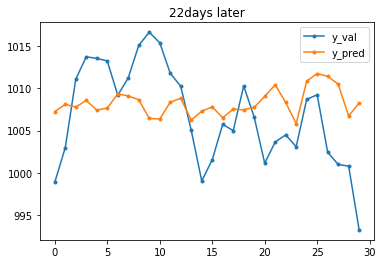

5.162454436622462
[600]	valid_0's l1: 5.01771
[1200]	valid_0's l1: 5.03258


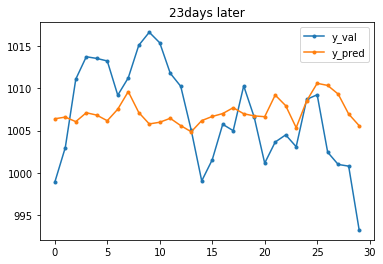

5.0325792296288645
[600]	valid_0's l1: 4.88775
[1200]	valid_0's l1: 4.89497


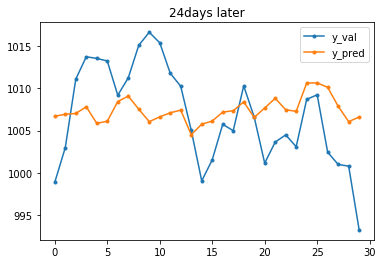

4.8949689741034454
[600]	valid_0's l1: 5.06734
[1200]	valid_0's l1: 5.08018


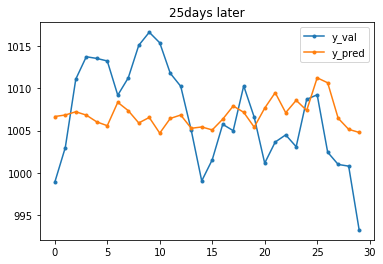

5.080178664026744
[600]	valid_0's l1: 5.00758
[1200]	valid_0's l1: 5.02079


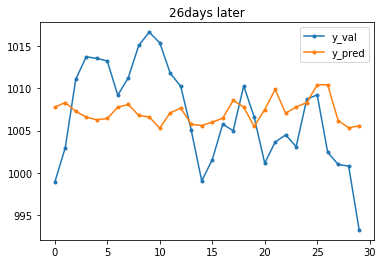

5.020796539078413
[600]	valid_0's l1: 5.12006
[1200]	valid_0's l1: 5.13746


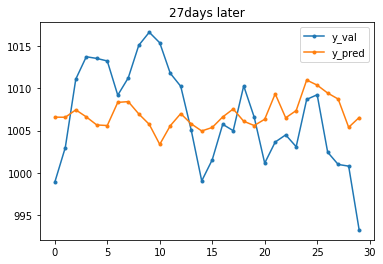

5.137460101374203
[600]	valid_0's l1: 5.0766
[1200]	valid_0's l1: 5.06432


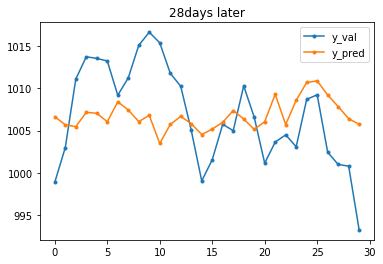

5.064325762435294
[600]	valid_0's l1: 4.69912
[1200]	valid_0's l1: 4.68797


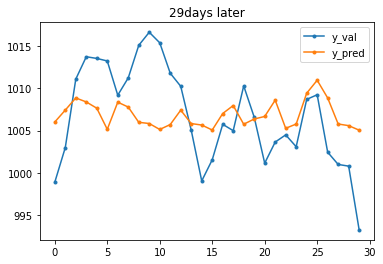

4.68797641301685
[600]	valid_0's l1: 4.86468
[1200]	valid_0's l1: 4.86301


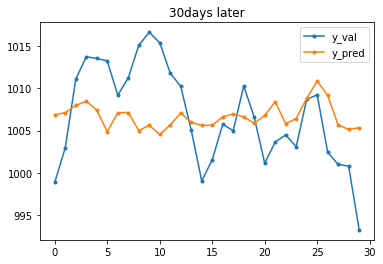

4.8630128936362285
[600]	valid_0's l1: 4.72633
[1200]	valid_0's l1: 4.7191


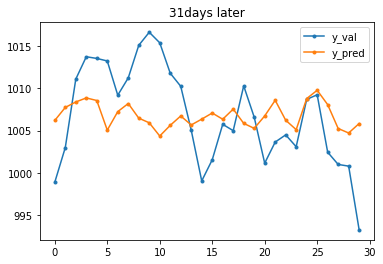

4.719100430521879
[600]	valid_0's l1: 4.84719
[1200]	valid_0's l1: 4.84119


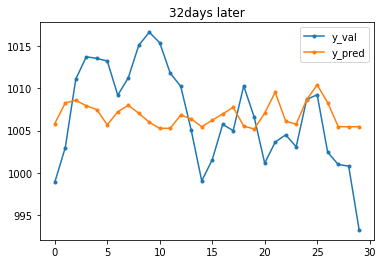

4.841192872816157
[600]	valid_0's l1: 4.92545
[1200]	valid_0's l1: 4.92598


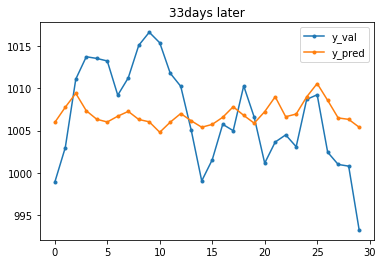

4.925979157207382
[600]	valid_0's l1: 4.60373
[1200]	valid_0's l1: 4.59098


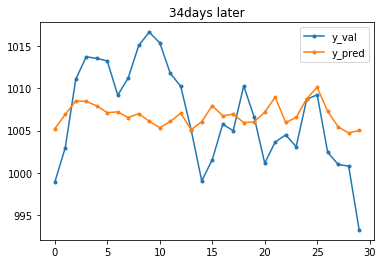

4.5909814495176455


In [53]:
y_columns = ['landP_min']
seaP_min_models = {}
scores = []

# 7일~34일 후를 예측하는 각각의 모델 구축
for future in range(7, 35):
    train_split = target.shape[0]-past-future-30
    x_train, y_train = trans(target, 0, train_split, past, future, press_x_columns, y_columns)
    x_val, y_val = trans(target, train_split, None, past, future, press_x_columns, y_columns)
    
    seaP_min_models[future] = seaP_model(x_train, y_train, x_val, y_val)
    
    pred = seaP_min_models[future].predict(x_val)
    
    plt.rcParams['figure.figsize'] = [6, 4]
    plt.plot(np.array(y_val), '.-', label='y_val')
    plt.plot(pred, '.-', label='y_pred')
    plt.title(str(future)+'days later')
    plt.legend()
    plt.show()
    
    score = mean_absolute_error(y_val, pred)
    scores.append(score)
    print(score)
    print('==========================================================================')

In [54]:
print("mean", sum(scores) / len(scores))
print("min", min(scores))
print("max", max(scores))

mean 4.9568400737643845
min 4.5909814495176455
max 5.465603781507457


## Mean

[600]	valid_0's l1: 4.55794
[1200]	valid_0's l1: 4.56287


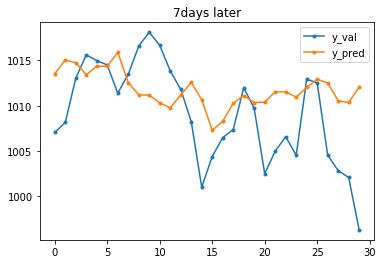

4.562864831236216
[600]	valid_0's l1: 4.58871
[1200]	valid_0's l1: 4.58646


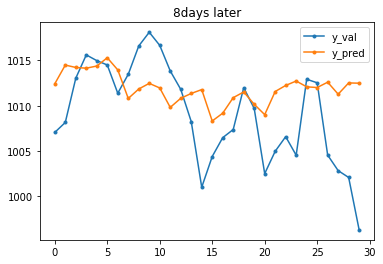

4.586456462249161
[600]	valid_0's l1: 4.92664
[1200]	valid_0's l1: 4.89392


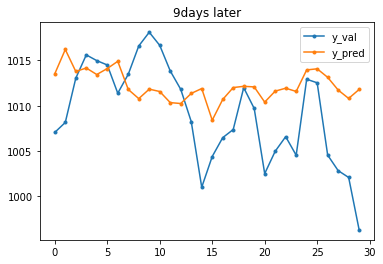

4.893918139792735
[600]	valid_0's l1: 4.75817
[1200]	valid_0's l1: 4.7431


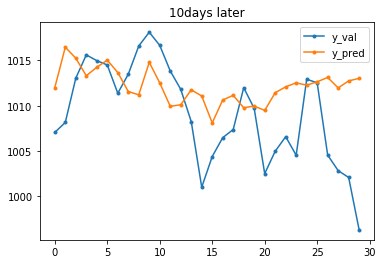

4.743099051415803
[600]	valid_0's l1: 4.63087
[1200]	valid_0's l1: 4.63663


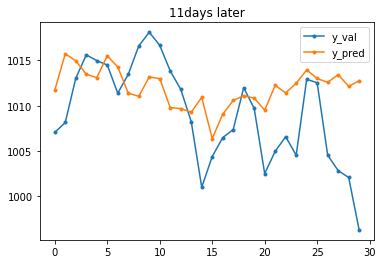

4.636630418317051
[600]	valid_0's l1: 4.60745
[1200]	valid_0's l1: 4.60979


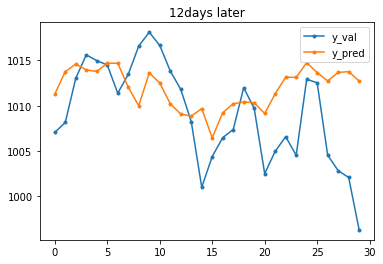

4.609786338872565
[600]	valid_0's l1: 4.45581
[1200]	valid_0's l1: 4.45476


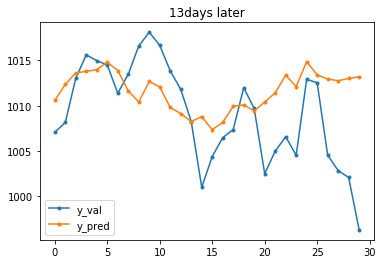

4.454757825483614
[600]	valid_0's l1: 4.44253
[1200]	valid_0's l1: 4.4338


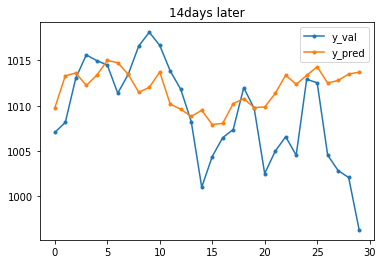

4.433805562596077
[600]	valid_0's l1: 4.40376
[1200]	valid_0's l1: 4.41262


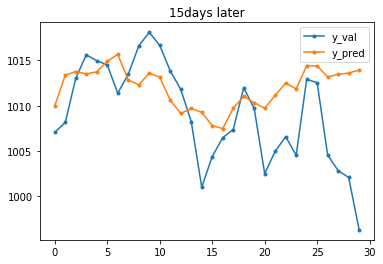

4.41261667286927
[600]	valid_0's l1: 4.54736
[1200]	valid_0's l1: 4.55646


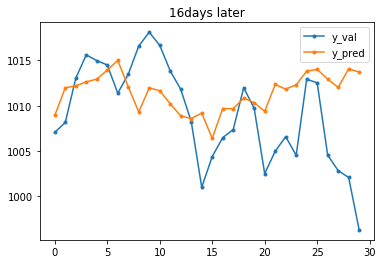

4.556463399238085
[600]	valid_0's l1: 4.56344
[1200]	valid_0's l1: 4.56291


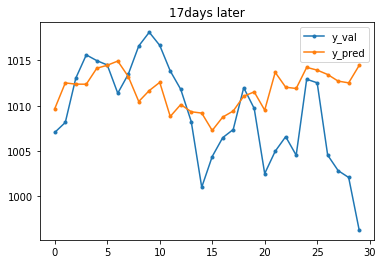

4.5629109043384535
[600]	valid_0's l1: 4.75079
[1200]	valid_0's l1: 4.75603


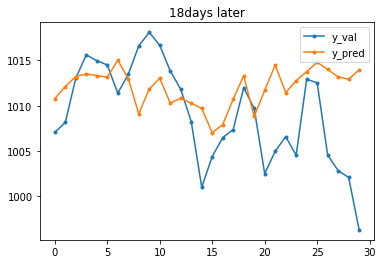

4.756035261601937
[600]	valid_0's l1: 4.40683
[1200]	valid_0's l1: 4.41062


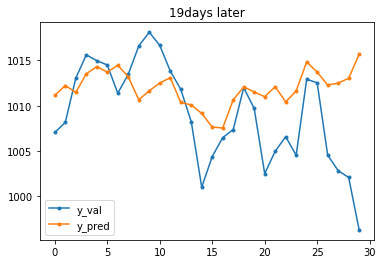

4.4106255358657185
[600]	valid_0's l1: 4.77214
[1200]	valid_0's l1: 4.79693


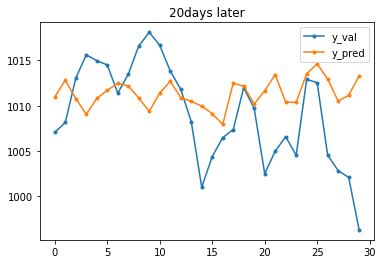

4.796932001044346
[600]	valid_0's l1: 4.62014
[1200]	valid_0's l1: 4.67149


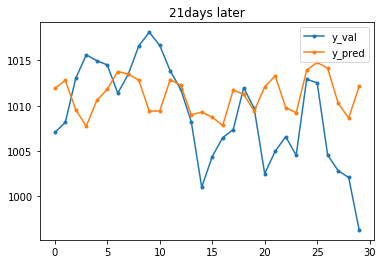

4.671492077655652
[600]	valid_0's l1: 4.71943
[1200]	valid_0's l1: 4.74014


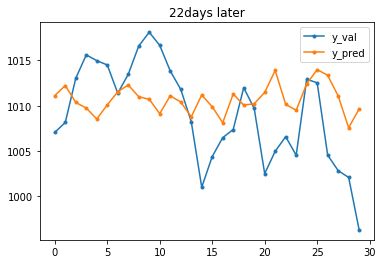

4.740140979198615
[600]	valid_0's l1: 4.57899
[1200]	valid_0's l1: 4.57142


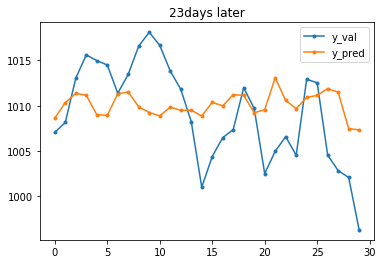

4.571416713297887
[600]	valid_0's l1: 4.84095
[1200]	valid_0's l1: 4.8579


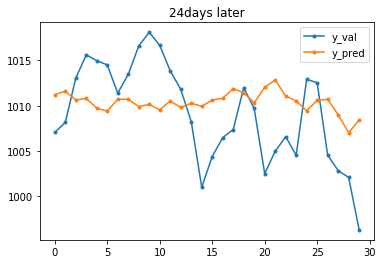

4.857901866430208
[600]	valid_0's l1: 4.76397
[1200]	valid_0's l1: 4.76422


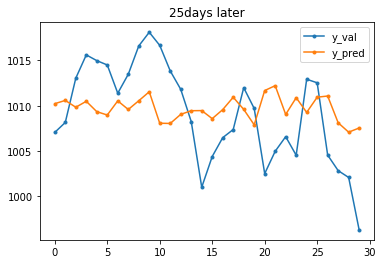

4.764225536778413
[600]	valid_0's l1: 4.69552
[1200]	valid_0's l1: 4.70222


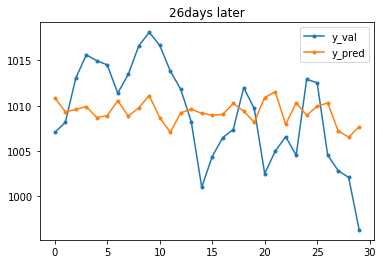

4.702221141108354
[600]	valid_0's l1: 4.68513
[1200]	valid_0's l1: 4.68273


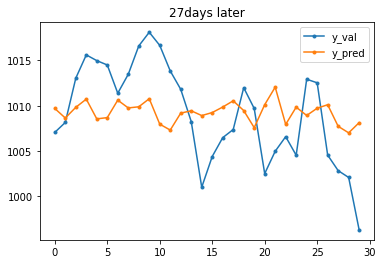

4.6827338400959695
[600]	valid_0's l1: 4.57599
[1200]	valid_0's l1: 4.57507


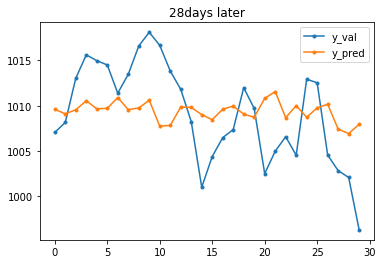

4.575074696110786
[600]	valid_0's l1: 4.42304
[1200]	valid_0's l1: 4.41611


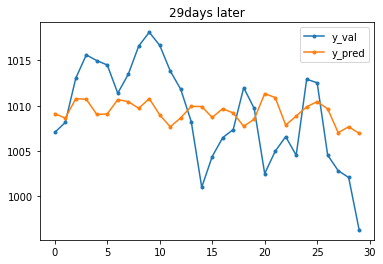

4.416108395929992
[600]	valid_0's l1: 4.39745
[1200]	valid_0's l1: 4.38599


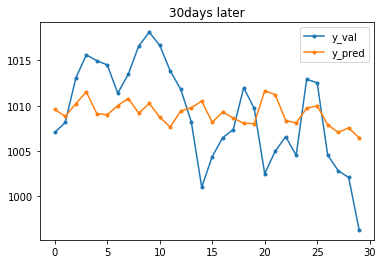

4.38598828021837
[600]	valid_0's l1: 4.65065
[1200]	valid_0's l1: 4.64889


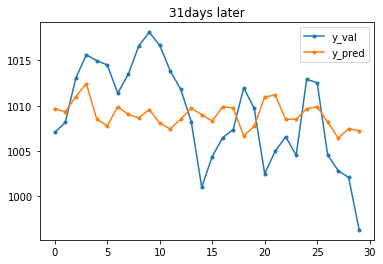

4.648893932613684
[600]	valid_0's l1: 4.61371
[1200]	valid_0's l1: 4.60145


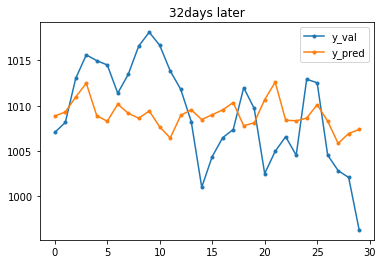

4.601453959636861
[600]	valid_0's l1: 4.45238
[1200]	valid_0's l1: 4.45443


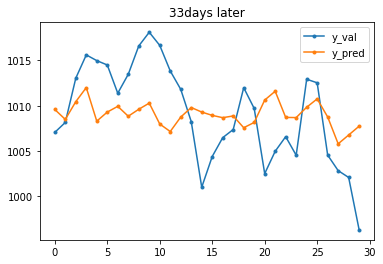

4.454428033128632
[600]	valid_0's l1: 4.47087
[1200]	valid_0's l1: 4.46489


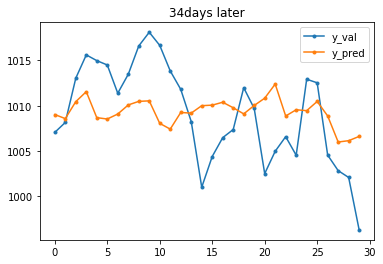

4.464884743045355


In [55]:
y_columns = ['landP_mean']
seaP_mean_models = {}
scores = []

# 7일~34일 후를 예측하는 각각의 모델 구축
for future in range(7, 35):
    train_split = target.shape[0]-past-future-30
    x_train, y_train = trans(target, 0, train_split, past, future, press_x_columns, y_columns)
    x_val, y_val = trans(target, train_split, None, past, future, press_x_columns, y_columns)
    
    seaP_mean_models[future] = seaP_model(x_train, y_train, x_val, y_val)
    
    pred = seaP_mean_models[future].predict(x_val)
    
    plt.rcParams['figure.figsize'] = [6, 4]
    plt.plot(np.array(y_val), '.-', label='y_val')
    plt.plot(pred, '.-', label='y_pred')
    plt.title(str(future)+'days later')
    plt.legend()
    plt.show()
    
    score = mean_absolute_error(y_val, pred)
    scores.append(score)
    print(score)
    print('==========================================================================')

In [56]:
print("mean", sum(scores) / len(scores))
print("min", min(scores))
print("max", max(scores))

mean 4.60549523572035
min 4.38598828021837
max 4.893918139792735


# Predict future

In [57]:
display(target)
print(target.shape)

,date,smp_max,smp_min,smp_mean,supply,year,month,day,dayofweek,temp_max,...,landP_mean,seaP_max,seaP_min,seaP_mean,sfctemp_max,sfctemp_min,sfctemp_mean,stand_temp_max,stand_temp_min,stand_temp_mean
0,2018-02-01,150.65,116.84,132.71,87.47,2018,2,1,3,5.95,...,1021.827083,1028.65,1025.65,1026.722917,13.45,1.45,4.293750,-1.785005,-1.661420,-1.433158
1,2018-02-02,163.86,116.84,134.19,86.64,2018,2,2,4,5.25,...,1022.212500,1028.55,1026.15,1027.408333,13.70,0.85,4.072917,-1.884273,-1.761867,-1.550427
2,2018-02-03,164.07,116.85,131.39,88.28,2018,2,3,5,4.00,...,1022.839583,1028.60,1026.05,1027.387500,4.25,0.55,2.060417,-2.061538,-2.061732,-1.957419
3,2018-02-04,171.00,115.76,131.89,86.14,2018,2,4,6,0.30,...,1023.377083,1028.35,1026.65,1027.793750,3.80,0.15,1.150000,-2.586243,-2.407255,-2.171263
4,2018-02-05,170.34,123.89,137.96,90.63,2018,2,5,0,2.05,...,1022.018750,1028.40,1024.15,1026.366667,4.85,0.25,1.502083,-2.338072,-2.264097,-2.122975
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
833,2020-05-14,193.28,66.78,100.46,62.70,2020,5,14,3,22.35,...,1012.525000,1019.30,1013.35,1016.764583,31.90,11.90,20.660417,0.540714,0.417315,0.174117
834,2020-05-15,198.23,61.81,102.38,64.91,2020,5,15,4,21.50,...,1004.537500,1013.20,1006.75,1008.741667,24.85,18.60,20.304167,0.420173,0.503622,0.650091
835,2020-05-16,220.91,88.50,121.19,61.75,2020,5,16,5,19.05,...,1002.822917,1008.80,1005.50,1007.195833,24.40,17.60,20.197917,0.072734,0.230856,0.284488
836,2020-05-17,207.75,65.78,116.82,61.55,2020,5,17,6,20.35,...,1002.068750,1007.50,1004.90,1006.322917,31.35,15.90,21.227083,0.257089,0.140130,0.084441


(838, 33)


In [ ]:
x_test = np.array(target.loc[700:, ['year', 'month', 'day', 'dayofweek', 'supply', 'temp_max', 'temp_min', 'temp_mean']])
x_test = x_test.reshape(1,-1)

In [ ]:
supply_result=[]
for future in range(7, 35):
    supply_result.append(supply_models[future].predict(x_test))
supply_result = np.array(supply_result).reshape(-1)

In [ ]:
x_test = np.array(target.loc[700:, ['year', 'month', 'day', 'temp_max', 'temp_min', 'temp_mean']])
x_test = x_test.reshape(1,-1)

In [ ]:
temp_max_result=[]
for future in range(7, 35):
    temp_max_result.append(temp_max_models[future].predict(x_test))
temp_max_result = np.array(temp_max_result).reshape(-1)

In [ ]:
temp_min_result=[]
for future in range(7, 35):
    temp_min_result.append(temp_min_models[future].predict(x_test))
temp_min_result = np.array(temp_min_result).reshape(-1)

In [ ]:
temp_mean_result=[]
for future in range(7, 35):
    temp_mean_result.append(temp_mean_models[future].predict(x_test))
temp_mean_result = np.array(temp_mean_result).reshape(-1)

In [ ]:
submission = pd.read_csv('data/sample_submission.csv')
submission_bottom_half = submission.loc[28:,:]
submission = submission.loc[:27, :]
test = submission.copy()
test['date'] = pd.to_datetime(test['date'])
test['year'] = test['date'].dt.year
test['month'] = test['date'].dt.month
test['day'] = test['date'].dt.day
test['dayofweek'] = test['date'].dt.dayofweek
test['supply'] = np.array(supply_result).reshape(-1)
test['temp_max'] = np.array(temp_max_result).reshape(-1)
test['temp_min'] = np.array(temp_min_result).reshape(-1)
test['temp_mean'] = np.array(temp_mean_result).reshape(-1)
test.head()

In [ ]:
def create_model(x_data, y_data, k=5):
    models = []
    
    k_fold = KFold(n_splits=k, shuffle=True, random_state=77)
    
    for train_idx, val_idx in k_fold.split(x_data):
        x_train, y_train = x_data.iloc[train_idx], y_data[train_idx]
        x_val, y_val = x_data.iloc[val_idx], y_data[val_idx]
    
        d_train = lgb.Dataset(x_train, y_train)
        d_val = lgb.Dataset(x_val, y_val)

        params = {
            'metric': 'mse',
            'seed':777
            }

        model = lgb.train(params, d_train, 1000, d_val, verbose_eval=1000, early_stopping_rounds=100)
        
        plt.rcParams['figure.figsize'] = [12, 4]
        plt.plot(np.array(y_val), '.-', label='y_val')
        plt.plot(model.predict(x_val), '.-', label='y_pred')
        plt.legend()
        plt.show()
        models.append(model)

    return models

In [ ]:
x_train = target.loc[:, ['supply', 'year', 'month', 'day', 'dayofweek', 'temp_max', 'temp_min', 'temp_mean']]
y_train = target.loc[:, ['smp_min', 'smp_max', 'smp_mean' ]]

smp_models = {}
for label in y_train.columns:
    print('train column : ', label)
    smp_models[label] = create_model(x_train, y_train[label])
    print('==========================================================================')

In [ ]:
x_test = test.loc[:,['supply', 'year', 'month', 'day', 'dayofweek', 'temp_max', 'temp_min', 'temp_mean']]
for label in ['smp_min', 'smp_max', 'smp_mean']:
    preds = []
    for i in range(5):
        preds.append(smp_models[label][i].predict(x_test))
    pred = sum(preds)/len(preds)
    test[label] = pred

In [ ]:
submission.loc[:, ['smp_min', 'smp_max', 'smp_mean', 'supply']] = test.loc[:,['smp_min', 'smp_max', 'smp_mean', 'supply']]
submission = pd.concat([submission, submission_bottom_half], axis = 0)
submission

In [ ]:
submission.to_csv('Dacon_baseline.csv', index=False)